In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [2]:
import sys
import os

# sys.path.append(os.path.abspath("/mnt/skin_cancer_nas/eye_vein_pulse/pipelines"))
# sys.path.append(os.path.abspath("/mnt/skin_cancer_nas/eye_vein_pulse/pipelines/frames_from_video"))
# sys.path.append(os.path.abspath("/mnt/skin_cancer_nas/eye_vein_pulse/data/torch_generator"))
# sys.path.append(os.path.abspath("/mnt/skin_cancer_nas/eye_vein_pulse/nas/darts_torch"))
# sys.path.append('/mnt')
# sys.path.append('/mnt/src')
# sys.path.append('/mnt/src/eye_vein_pulse')

# from src.eye_vein_pulse.pipelines.frames_from_video import nodes as frames_from_video_nodes

import PIL
from PIL import Image
from numpy import *
from pylab import *

import cv2

from tqdm.notebook import tqdm

import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML
from matplotlib.pyplot import imshow

from sklearn.decomposition import PCA



import cv2

# from skimage.filters import meijering

In [3]:
%matplotlib inline

In [129]:
# import cv2 
# import numpy as np 
# import matplotlib.pyplot as plt
# def register_frames_matrix(frames_matrix, registration_func):
    
    
    
#     # Read the images to be aligned
#     im1_gray = frames_matrix[i, :, :]    # the image that the alignment is based on
#     im2_gray = frames_matrix[i+1, :, :]  # the image that will be aligned

def register_opencv_findTransformECC(im1_gray, im2_gray, warp_mode=cv2.MOTION_TRANSLATION, mask=None, number_of_iterations=500):
    '''
    We will register starting from first image, and will move forward (each pair of images will be registered)
    First image in the stack can be currapted, thus it is desirable to align propagating pairs of images:
    1 vs 2, 2nd aligned to first with 3rd.
    
    Image will be skipped from alignment if too large shift/rotation will be detected.
    '''
    
    im1 = im1_gray
    # Find size of image1
    sz = im1.shape

    # Define 2x3 or 3x3 matrices and initialize the matrix to identity
    if warp_mode == cv2.MOTION_HOMOGRAPHY :
        warp_matrix = np.eye(3, 3, dtype=np.float32)
    else :
        warp_matrix = np.eye(2, 3, dtype=np.float32)

    # Specify the threshold of the increment
    # in the correlation coefficient between two iterations
    termination_eps = 1e-10;

    # Define termination criteria
    criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, number_of_iterations,  termination_eps)

    # Run the ECC algorithm. The results are stored in warp_matrix.
    try:
        cc, warp_matrix = cv2.findTransformECC(im1_gray, im2_gray, warp_matrix, warp_mode, criteria, inputMask=mask, gaussFiltSize=1)
    except Exception:
        print('Error occured!')
#         cc, warp_matrix = cv2.findTransformECC(im1_gray, im2_gray, warp_matrix, warp_mode, criteria, inputMask=None, gaussFiltSize=0)
        cc = -1.0
        im2_aligned = np.zeros(im2_gray.shape)

    im2 = im2_gray
    # Use warpPerspective for Homography
    if warp_mode == cv2.MOTION_HOMOGRAPHY :
        im2_aligned = cv2.warpPerspective (im2, warp_matrix, (sz[1],sz[0]), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP)

    else :
        # Use warpAffine for Translation, Euclidean and Affine
        im2_aligned = cv2.warpAffine(im2, warp_matrix, (sz[1],sz[0]), flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP, borderMode=cv2.BORDER_REPLICATE);
        
    return im2_aligned, cc, warp_matrix

# # Show final results
# fig = plt.figure() #define figure
# #plt.rcParams.update({'font.size': 40}) #label text size
# fig.subplots_adjust(hspace=0.2, wspace=0.47) #spaces between the sub-plots
# fig=plt.figure(figsize=(25, 25), dpi= 100, facecolor='w', edgecolor='k') #change size of the output figure

# ax1 = fig.add_subplot(1, 1, 1)
# #turn off matlab graph ticks
# ax1.set_yticklabels([])
# ax1.set_xticklabels([])

# #Show image
# ax1.imshow(im2_aligned)

# #Save figure
# plt.savefig(path + folder_nr + "//uv//uv_aligned.png", bbox_inches='tight', pad_inches=0)
# print('Aligned UV image saved!')

In [108]:
def register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_TRANSLATION): 

    registered_frames = []
    cc_list = []
    warp_matrix_list = []
    ref_image = frames_matrix[0, :, :]
    
    registered_frames.append(ref_image)
    cc_list.append(1.0)
    warp_matrix_list.append(np.eye(2, 3, dtype=np.float32))
    
    for i in tqdm(range(1, frames_matrix.shape[0])):
        im_to_register = frames_matrix[i, :, :]
        im2_aligned, cc, warp_matrix = register_opencv_findTransformECC( im1_gray=ref_image, 
                                                                         im2_gray=im_to_register, 
                                                                         warp_mode=warp_mode, 
                                                                         mask=None, 
                                                                         number_of_iterations=number_of_iterations)
        registered_frames.append(im2_aligned)
        cc_list.append(cc)
        warp_matrix_list.append(warp_matrix)
            
    return registered_frames, cc_list, warp_matrix_list


In [265]:
def frames_matrix_from_images_folder(folder):
    
    r_folder = os.path.join(folder, 'r')
    ir_folder = os.path.join(folder, 'ir')
    g_folder = os.path.join(folder, 'g')
    # UV folder contains set of images
    uv_folder = os.path.join(folder, 'uv')
    white_folder = os.path.join(folder, 'white')
    
    files_dict = {}
    
    if os.path.isdir(r_folder):
        r_files = list(os.listdir(r_folder))
        if len(r_files) > 0:
            r_file_path = os.path.join(r_folder, r_files[0])
            r = cv2.imread(r_file_path, cv2.IMREAD_GRAYSCALE)
            files_dict['r'] = (r, r_file_path)
            
    if os.path.isdir(ir_folder):
        ir_files = list(os.listdir(ir_folder))
        if len(ir_files) > 0:
            ir_file_path = os.path.join(ir_folder, ir_files[0])
            ir = cv2.imread(ir_file_path, cv2.IMREAD_GRAYSCALE)
            files_dict['ir'] = (ir, ir_file_path)
            
    if os.path.isdir(g_folder):
        g_files = list(os.listdir(g_folder))
        if len(g_files) > 0:
            g_file_path = os.path.join(g_folder, g_files[0])
            g = cv2.imread(g_file_path, cv2.IMREAD_GRAYSCALE)
            files_dict['g'] = (g, g_file_path)
            
    if os.path.isdir(uv_folder):
        uv_files = list(os.listdir(uv_folder))
        if len(uv_files) > 0:
            i = 0
            for uv_file in uv_files:
                uv_file_path = os.path.join(uv_folder, uv_file)
                uv = cv2.imread(uv_file_path, cv2.IMREAD_GRAYSCALE)
                files_dict['uv-{}'.format(i)] = (uv, uv_file_path)
                i = i + 1
                
    if os.path.isdir(white_folder):
        white_files = list(os.listdir(white_folder))
        if len(white_files) > 0:
            white_file_path = os.path.join(white_folder, white_files[0])
            white = cv2.imread(white_file_path, cv2.IMREAD_COLOR)
            files_dict['white-g'] = (white[:, :, 1], white_file_path)
            files_dict['white-r'] = (white[:, :, 2], white_file_path)
#             files_dict['white'] = (white, white_file_path)
    
    files_list = []
    if 'r' in files_dict:
        files_list.append(files_dict['r'][0])
    if 'ir' in files_dict:
        files_list.append(files_dict['ir'][0])
    if 'g' in files_dict:
        files_list.append(files_dict['g'][0])
    if 'uv-0' in files_dict:
        keys = files_dict.keys()
        def is_uv_key(k):
            return 'uv' in k

        uv_keys = list(filter(is_uv_key, keys))
        uv_keys.sort()
        for uv_k in uv_keys:
            files_list.append(files_dict[uv_k][0])
            break
            
    # It is assumed that white images if present are the last ones! See registration function.
    if 'white-g' in files_dict:
        files_list.append(files_dict['white-g'][0])
    if 'white-r' in files_dict:
        files_list.append(files_dict['white-r'][0])
#     if 'white' in files_dict:
#         files_list.append(files_dict['white'][0])
    
    return files_dict, files_list
    
    
#     only_tif_files = [f for f in os.listdir(captured_video_folder) if os.path.isfile(os.path.join(captured_video_folder, f)) and f.endswith('.tif')]
#     only_tif_files.sort()
    
#     allfiles=only_tif_files
#     imlist=[]
#     for ff in tqdm(allfiles):
#         imlist.append(os.path.join(captured_video_folder, ff))

# #     im = array(Image.open(imlist[0]))
# #     m,n=im.shape[0:2]
# #     imnbr= list(imlist)

#     #create matrix to store all flattened images
#     frames_matrix = asarray([array(PIL.Image.open(im)) for im in imlist], 'f')
#     return frames_matrix

In [266]:
fmat_white = frames_matrix_from_images_folder('/mnt/data/interim/_melanoma_20200728/loc/B07.9/2019-08-21_10-59-37/')

In [270]:
fmat_white[1][5].shape

(512, 460)

In [271]:
# let's register r/ir/g/uv (grayscale) & bGR - Color images
frames_matrix_white = np.stack(fmat_white[1])
registered_frames_white, cc_list_white, warp_matrix_list_white = register_frames_matrix(frames_matrix_white, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)

Error occured!



In [219]:
# w = cv2.imread('/mnt/data/interim/_melanoma_20200728/loc/B07.9/2019-08-21_10-59-37/white/White_10ms.png')

In [272]:
# w[10,10,0]  # OpenCV reads images as BGR - hence first dimension is zeroes - there are no blue channel

In [113]:
files_dict, files_list = frames_matrix_from_images_folder('/mnt/data/interim/_melanoma_20200728/checkyourskin/A63/2019-03-25_11-39-21')

In [8]:
files_dict.keys()

dict_keys(['r', 'ir', 'g', 'uv-0', 'uv-1', 'uv-2', 'uv-3', 'uv-4', 'uv-5', 'uv-6', 'uv-7', 'uv-8', 'uv-9'])

In [9]:
len(files_list)

4

In [11]:
frames_matrix = np.stack(files_list)

In [12]:
frames_matrix.shape

(4, 448, 466)

In [119]:
registered_frames, cc_list, warp_matrix_list = register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)

In [120]:
frames_matrix.shape

(4, 448, 466)

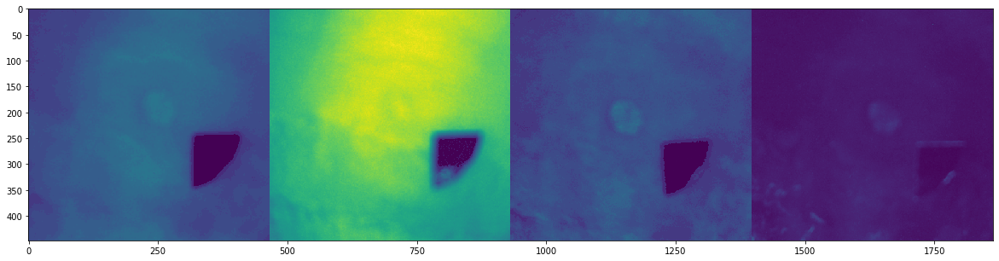

In [121]:
fig = plt.figure(figsize=(31,5))
imshow(np.hstack(frames_matrix))

In [22]:
registered_frames[2]

array([[ 0,  0,  0, ..., 44, 44, 45],
       [ 0,  0,  0, ..., 46, 45, 46],
       [ 0,  0,  0, ..., 46, 46, 46],
       ...,
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0]], dtype=uint8)

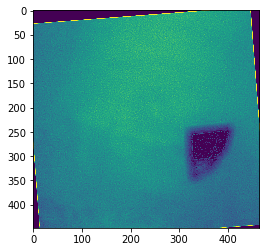

In [26]:
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
im = cv2.filter2D(registered_frames[1], -1, kernel)
# im = cv2.filter2D(im, -1, kernel)
imshow(im)

In [34]:
fig = plt.figure(figsize=(5,5))
registered_frames[1].shape

(448, 466)

<Figure size 360x360 with 0 Axes>

In [35]:
res = cv2.resize(registered_frames[1],None,fx=0.5, fy=0.5, interpolation = cv2.INTER_CUBIC)
fig = plt.figure(figsize=(5,5))
# imshow(res)
res.shape

(224, 233)

<Figure size 360x360 with 0 Axes>

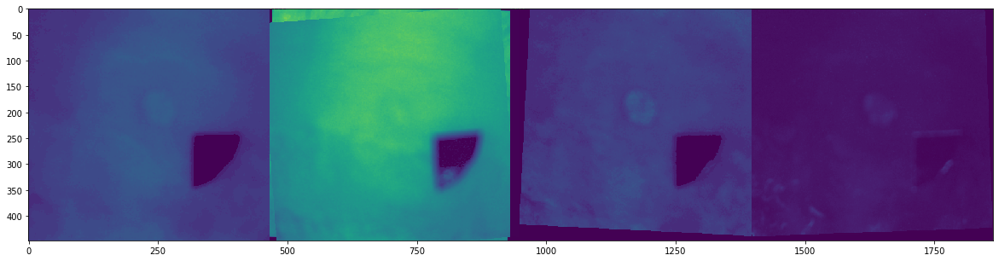

In [122]:
fig = plt.figure(figsize=(31,5))
imshow(np.hstack(registered_frames))

# Downscale, then register and apply warpMatrices on original iamges

In [44]:
!pip install scikit-image

     |████████████████████████████████| 12.4 MB 3.7 MB/s eta 0:00:01
     |████████████████████████████████| 148 kB 23.8 MB/s eta 0:00:01
     |████████████████████████████████| 4.4 MB 17.6 MB/s eta 0:00:01     |█████████████████▎              | 2.4 MB 17.6 MB/s eta 0:00:01
     |████████████████████████████████| 3.3 MB 14.8 MB/s eta 0:00:01
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [45]:
from skimage.transform import rescale, resize, downscale_local_mean

In [60]:
image = frames_matrix[0]  #color.rgb2gray(data.astronaut())

image_rescaled = rescale(image, 0.25, anti_aliasing=True)
image_resized = resize(image, (image.shape[0] // 4, image.shape[1] // 4),
                       anti_aliasing=True)
image_downscaled = downscale_local_mean(image, (4, 4))

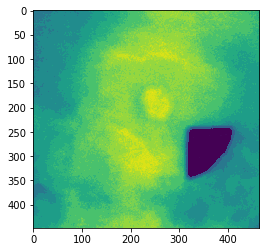

In [57]:
imshow(image)

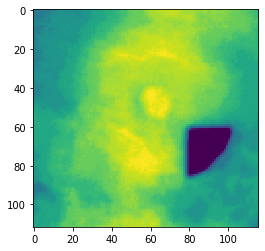

In [58]:
imshow(image_rescaled)

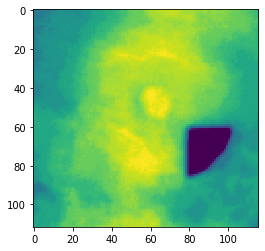

In [59]:
imshow(image_resized)

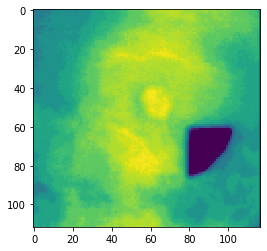

In [61]:
imshow(image_downscaled)

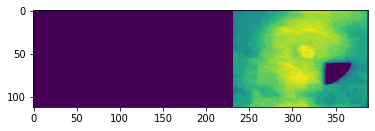

In [50]:
from skimage.transform import rescale, resize, downscale_local_mean

registered_frames_, cc_list, warp_matrix_list = register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)

# Let's try downscale by factor of 2 and then upscale by factor of 2

In [ ]:
!pip list

In [ ]:
!pip install --upgrade opencv-python
!pip install --upgrade opencv-contrib-python

In [ ]:
!pip list

In [18]:
from cv2 import dnn_superres

In [110]:
# import cv2
# from cv2 import dnn_superres

# # Create an SR object
# sr = dnn_superres.DnnSuperResImpl_create()

# # Read image
# image_ = registered_frames[0]  #cv2.imread('./input.png')

# # Read the desired model
# path = "/mnt/data/EDSR_x2.pb"
# sr.readModel(path)

# # Set the desired model and scale to get correct pre- and post-processing
# sr.setModel("edsr", 2)

# # Upscale the image
# result_ = sr.upsample(image_)

# # Save the image
# # cv2.imwrite("./upscaled.png", result)
# imshow(result_)

In [39]:
def register_folder(folder):
    files_dict, files_list = frames_matrix_from_images_folder(folder)
    registered_frames, cc_list, warp_matrix_list = register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)

In [123]:
def get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-01-22_09-41-18'):
    files_dict, files_list = frames_matrix_from_images_folder(folder)
    frames_matrix = np.stack(files_list)
    registered_frames, cc_list, warp_matrix_list = register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)
    
    fig = plt.figure(figsize=(31,5), dpi=150)
    imshow(np.vstack((np.hstack(frames_matrix), np.hstack(registered_frames))))

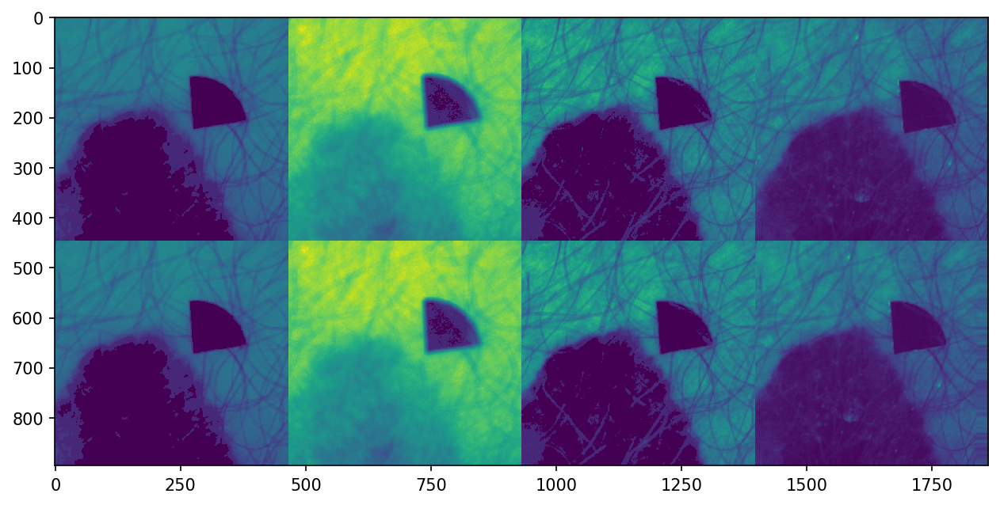

In [130]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-15_11-06-06')

In [125]:
def get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-15_11-06-06'):
    files_dict, files_list = frames_matrix_from_images_folder(folder)
    registered_frames, cc_list, warp_matrix_list = register_frames_matrix(np.stack(files_list), number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)
    fig = plt.figure(figsize=(31,5), dpi=150)
    imshow(np.vstack((np.hstack(np.stack(files_list)), np.hstack(registered_frames))))

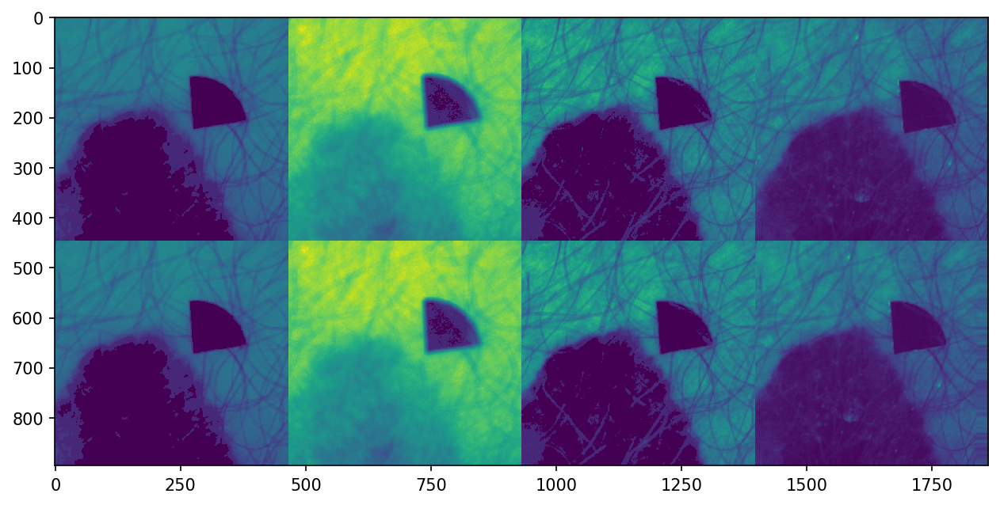

In [131]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-15_11-06-06')

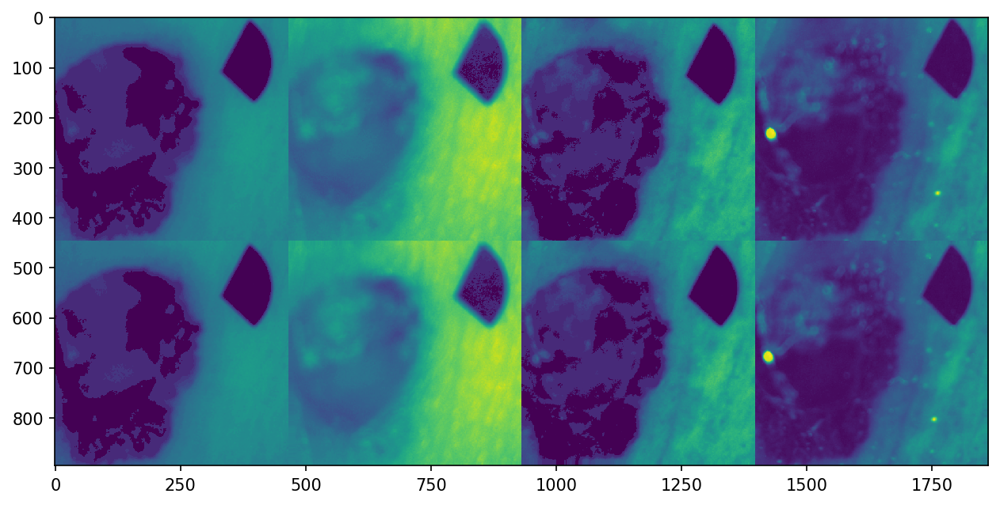

In [132]:
i = 1
C43_folder = list(os.listdir('/mnt/data/interim/_melanoma_20200728/checkyourskin/C43'))
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[i])

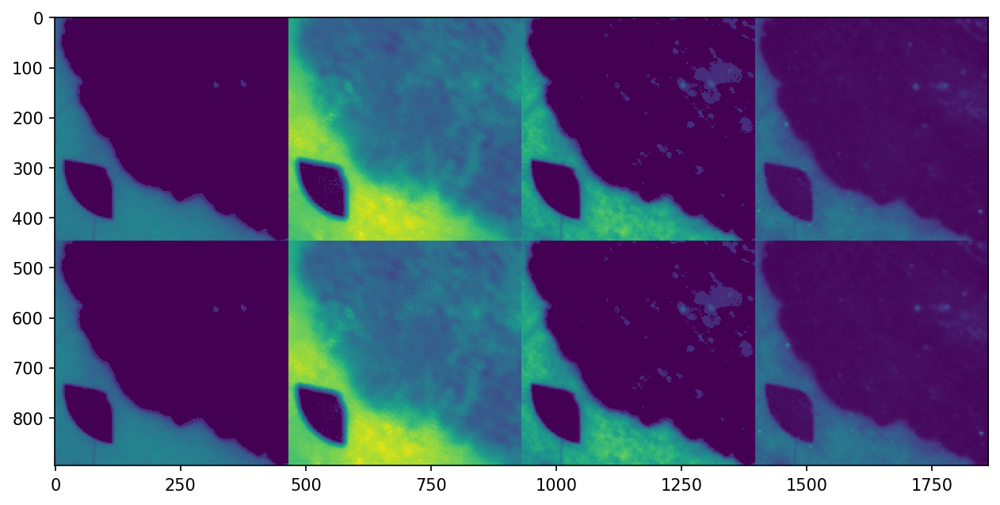

In [133]:
# Border replicate
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[2])

In [ ]:
# Border transparent

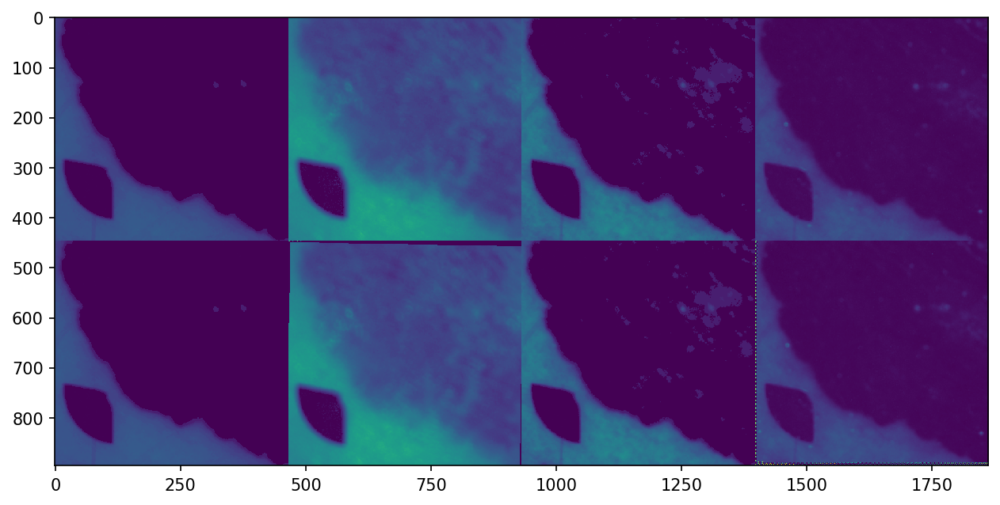

In [128]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[2])

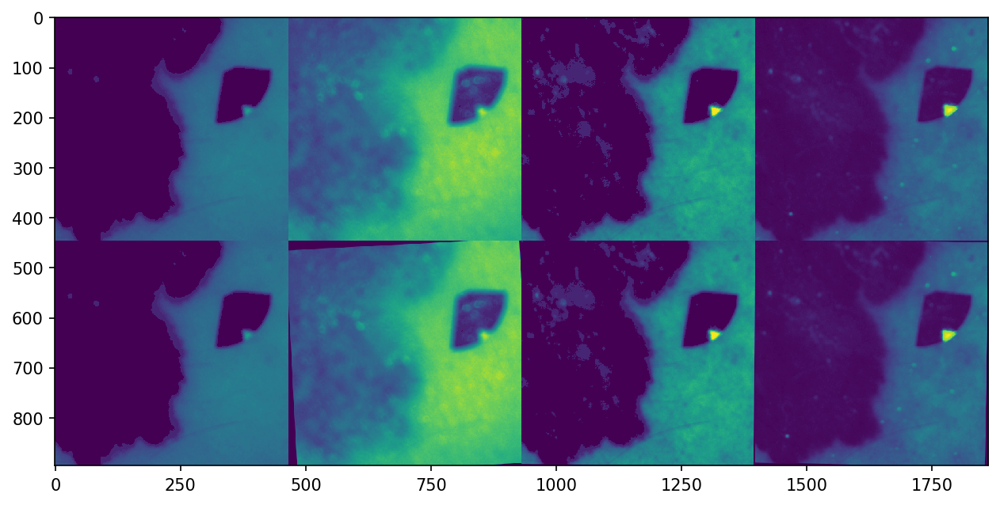

In [86]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[3])

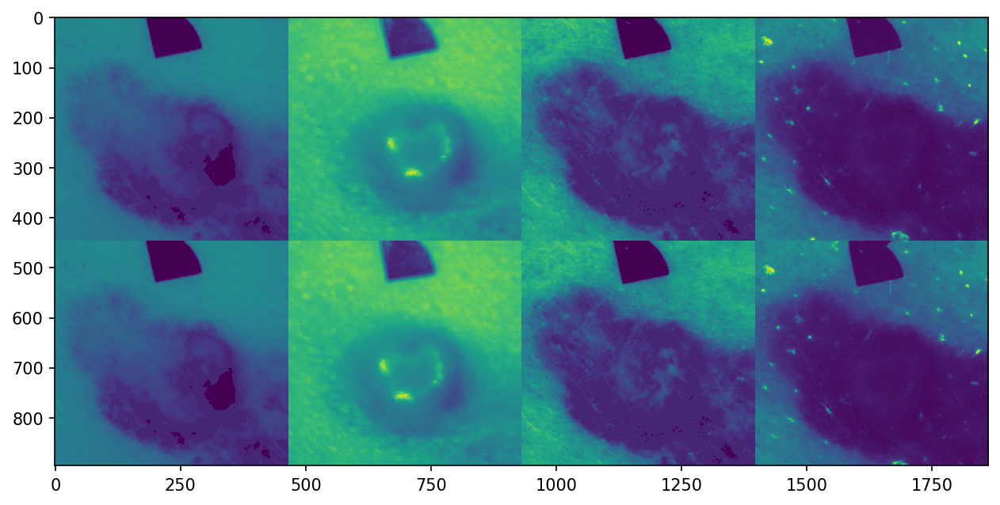

In [112]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[4])

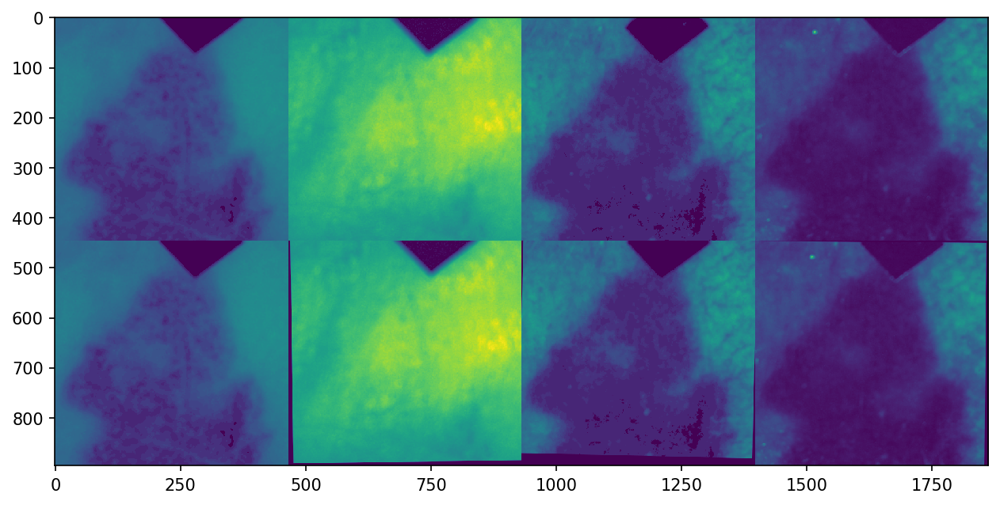

In [88]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[5])

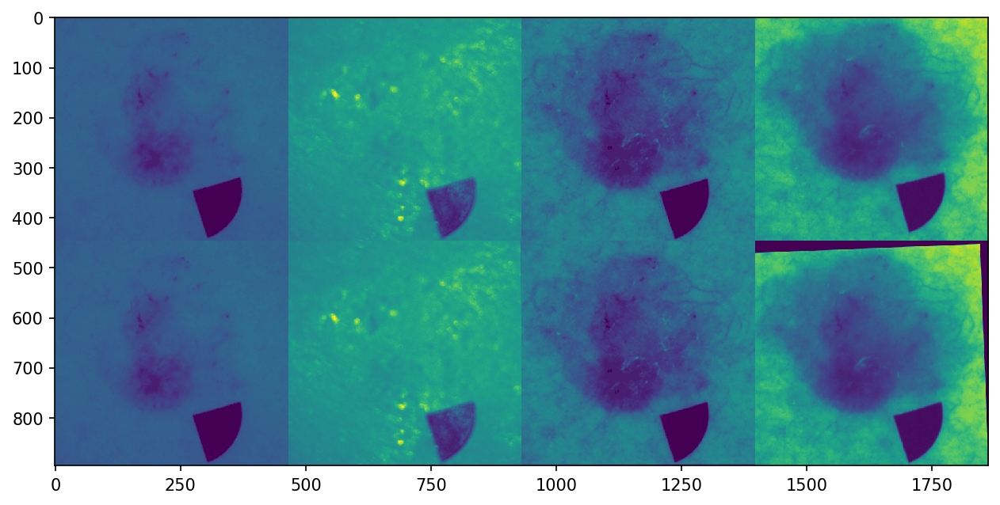

In [89]:
# Border tranparent
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[6])

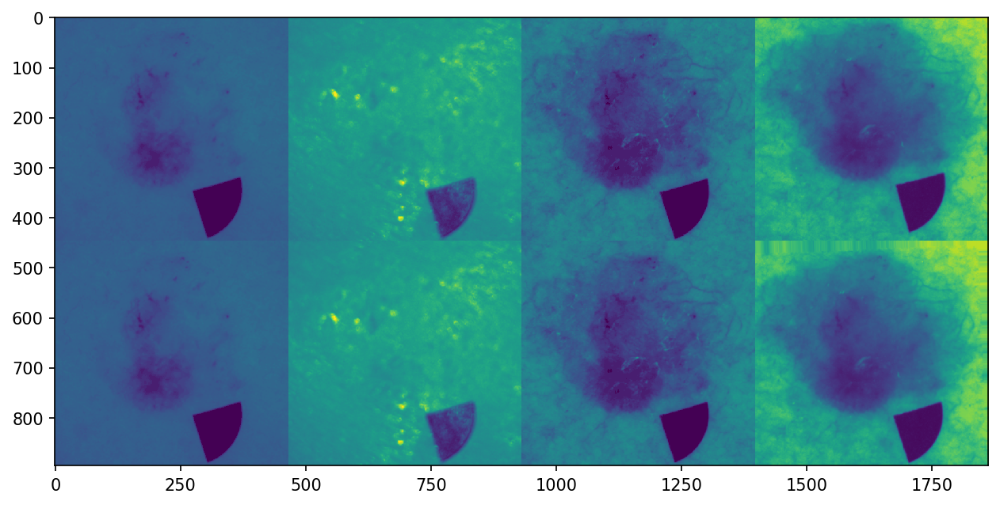

In [134]:
# Border REPLICATE
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[6])

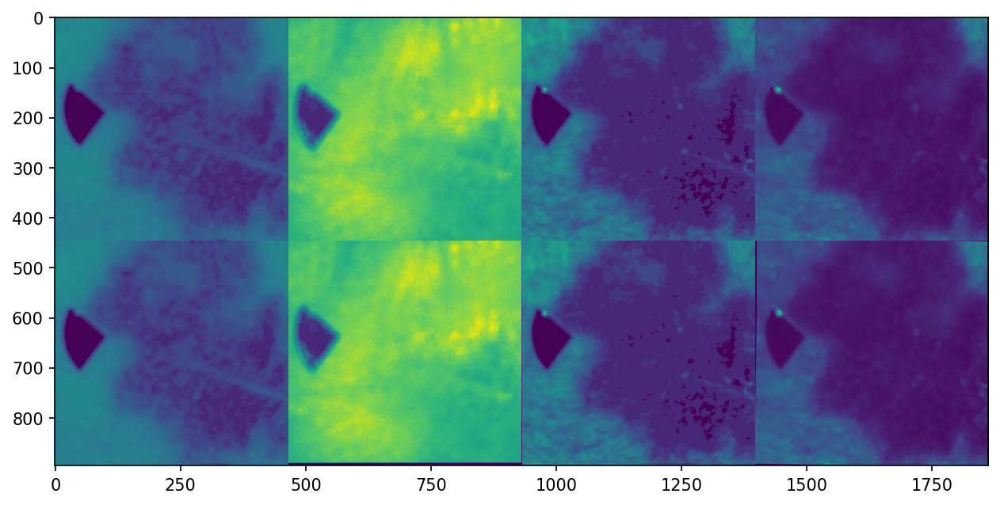

In [90]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[7])

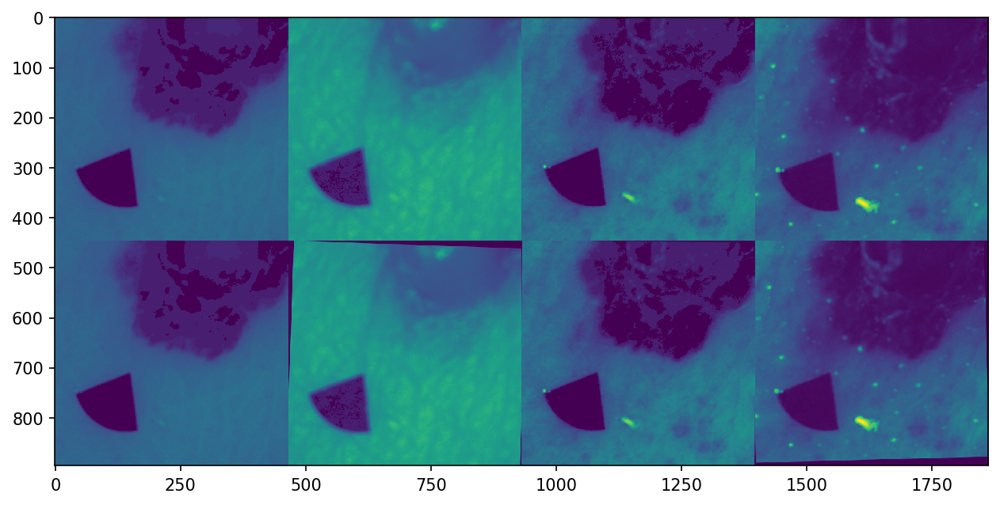

In [91]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[8])

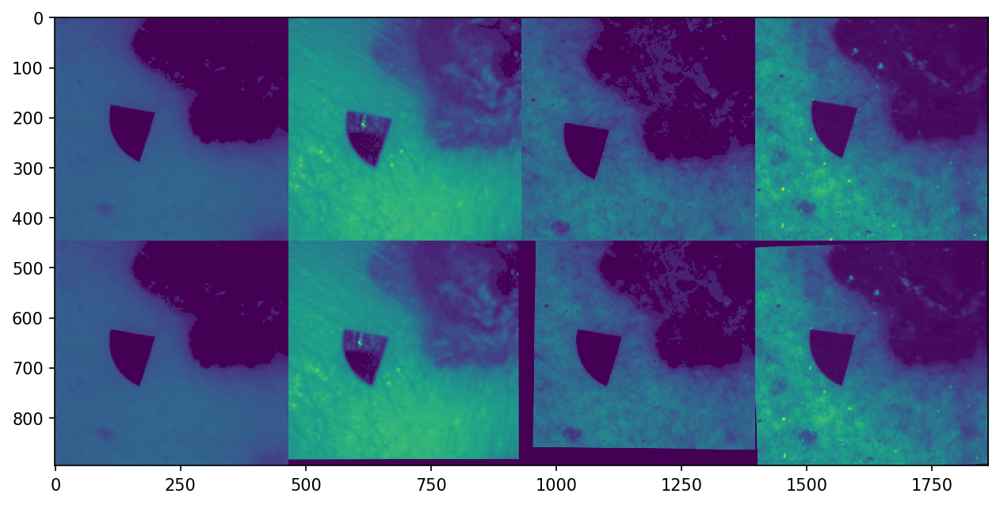

In [92]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[9])

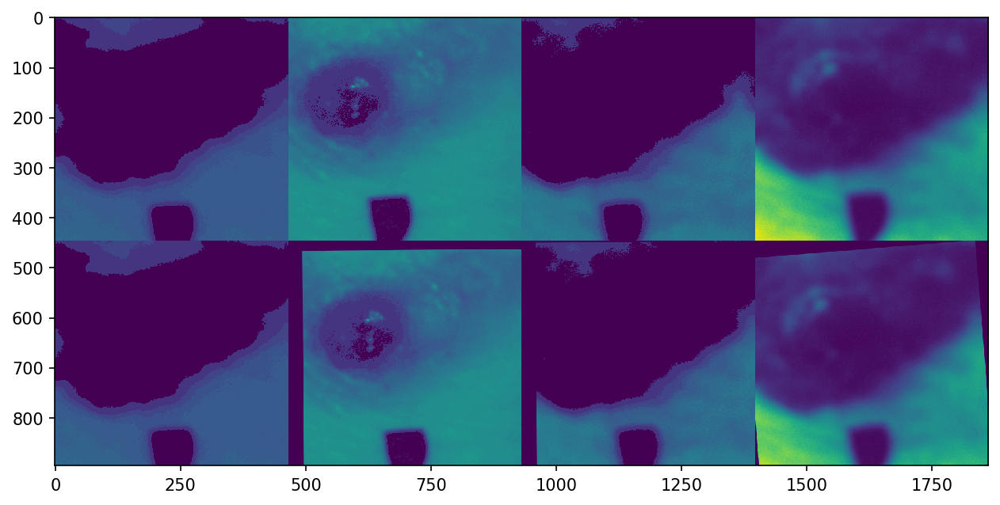

In [93]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[10])

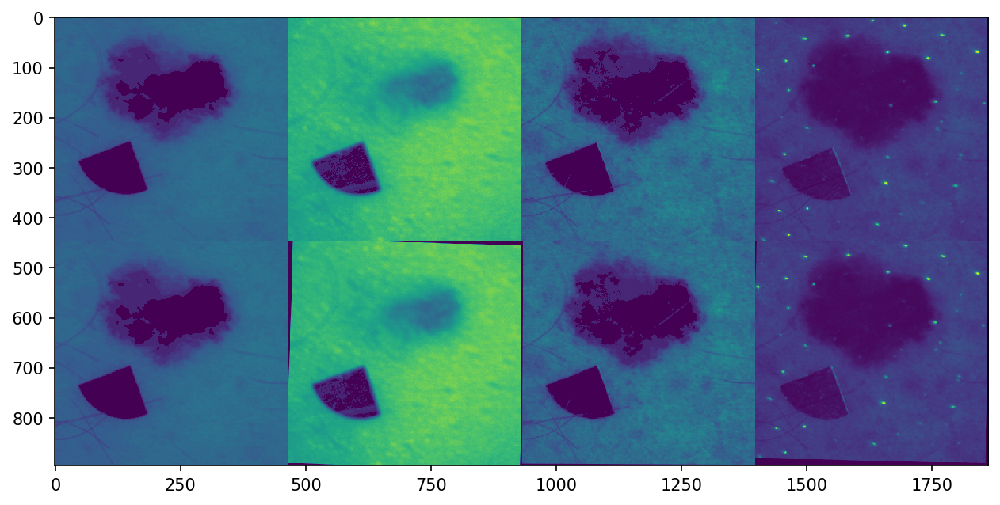

In [94]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[11])

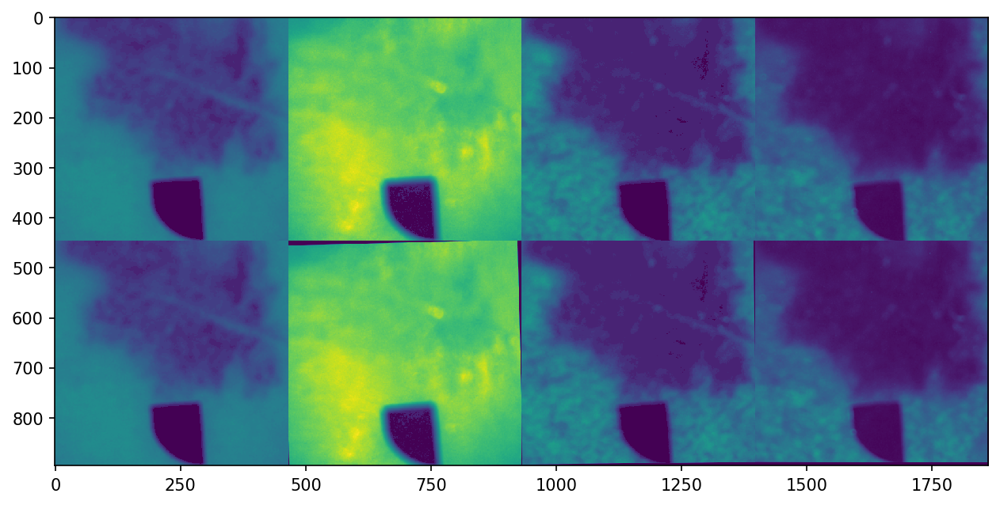

In [95]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[12])

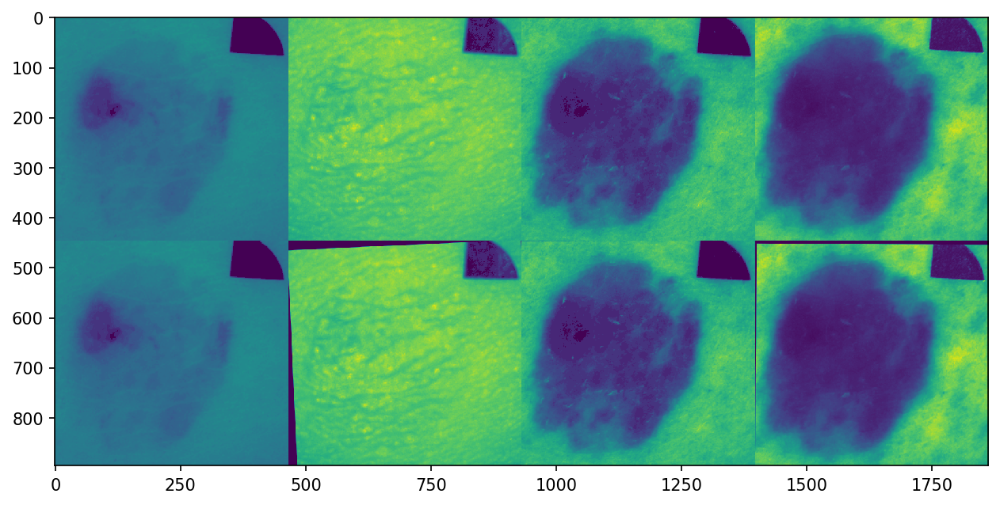

In [96]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[13])

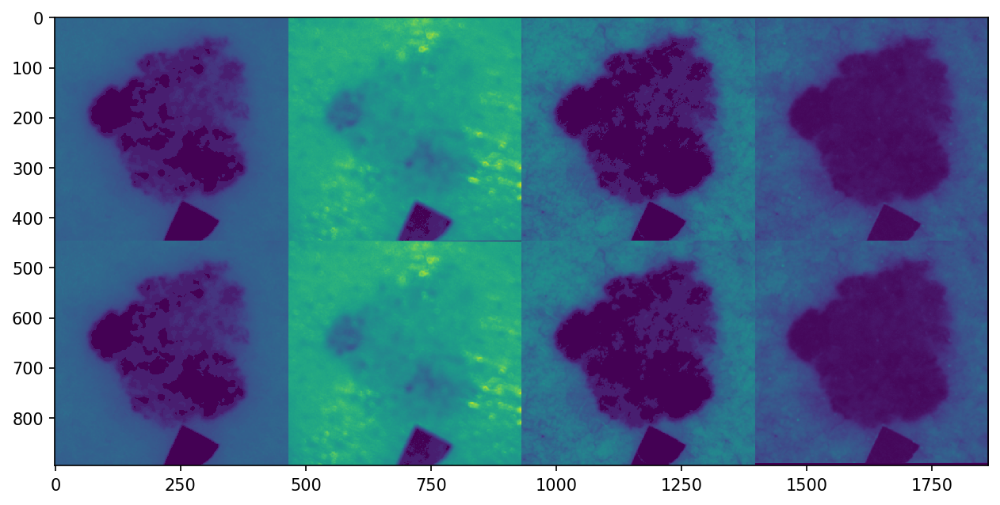

In [97]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[14])

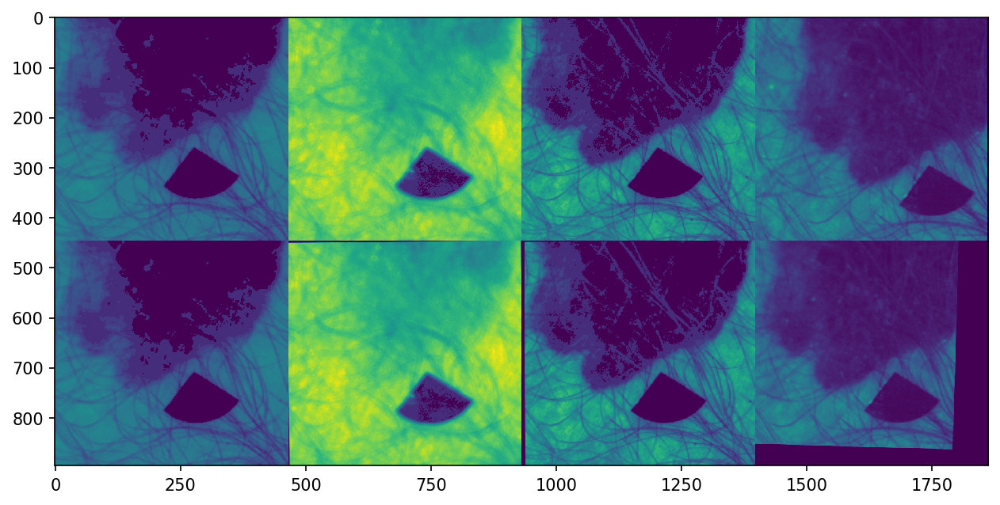

In [98]:
# BORDER_TRANSPARENT
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[15])

Error occured!



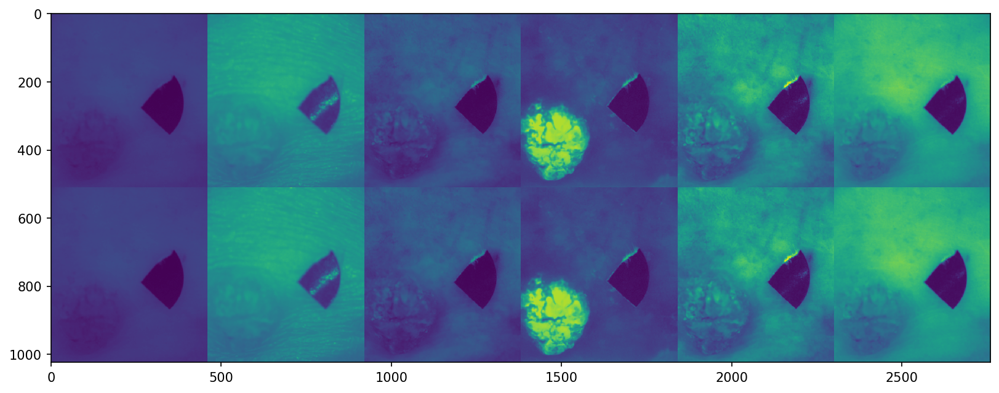

In [273]:
# BORDER_REPLICATE
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/loc/B07.9/2019-08-21_10-59-37/')

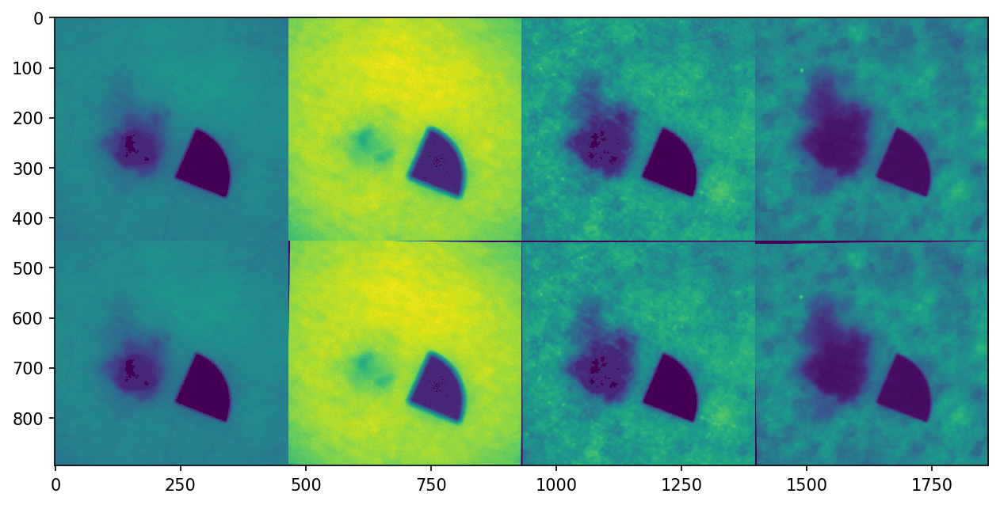

In [99]:
get_files_and_register(folder='/mnt/data/interim/_melanoma_20200728/checkyourskin/C43/'+C43_folder[16])

# REGISTERING DATASET

In [278]:
def register_dataset(in_folder, out_folder):
    dataset_diagnozes = list(os.listdir(in_folder))
#     print(dataset_diagnozes)
    for diagnoze in dataset_diagnozes:
#         print(diagnoze)
        diagnoze_folders = list(os.listdir(os.path.join(in_folder, diagnoze)))
#         print(diagnoze_folders)
        for diagnoze_sample in diagnoze_folders:
            diagnoze_sample_path = os.path.join(in_folder, diagnoze, diagnoze_sample)
            print('diagnoze_sample_path -', diagnoze_sample_path)
            if True: #not os.path.isdir(diagnoze_sample_path.replace(in_folder, out_folder)):
                try:
                    files_dict, files_list = frames_matrix_from_images_folder(folder=diagnoze_sample_path)
                    frames_matrix = np.stack(files_list)
                    registered_frames, cc_list, warp_matrix_list = register_frames_matrix(frames_matrix, number_of_iterations=500, warp_mode=cv2.MOTION_EUCLIDEAN)

        #             print('Frames registered ...')
                    for i in range(len(files_list)):
        #                 print('Looking for i={} frame'.format(i))
                        key = None #next((key for key, value in files_dict.items() if value[0] == files_list[i]), None)
                        orig_file_path = None
                        for k, value in files_dict.items():
                            if np.array_equal(value[0], files_list[i]):
                                key = k
                                orig_file_path = value[1]

        #                 print('key -', key)
                        # now we have to recreate all folders
                        rf = registered_frames[i]
                        new_path = orig_file_path
                        new_path = new_path.replace(in_folder, out_folder) #os.path.join(out_folder, diagnoze, diagnoze_sample, key)
                        os.makedirs(os.path.dirname(new_path), exist_ok = True)
                        cv2.imwrite(new_path, rf)

                    diagnostic_img_filepath = os.path.join(out_folder, diagnoze, diagnoze_sample, 'registration_diagnostic.png')
                    diagnostic_img = np.vstack((np.hstack(np.stack(files_list)), np.hstack(registered_frames)))
        #             print('diagnostic_img_filepath -', diagnostic_img_filepath)
                    os.makedirs(os.path.dirname(diagnostic_img_filepath), exist_ok=True)
                    cv2.imwrite(diagnostic_img_filepath, diagnostic_img)
                except Exception as e:
                    print(e)
            else:
                print('    Already processed, skipping...')

In [279]:
register_dataset(in_folder='/mnt/data/interim/_melanoma_20200728/checkyourskin', out_folder='/mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE/checkyourskin')

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L92/2019-03-18_10-20-29



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L92/2019-03-18_10-12-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L92/2019-03-18_10-10-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L92/2019-03-18_10-16-25



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L92/2019-03-18_10-18-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L92/2019-03-18_10-14-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-02-05_11-53-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-03-29_10-16-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-02-12_11-41-26



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-02-05_11-54-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-02-05_11-50-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-04-11_09-53-42



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-02-05_11-51-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-03-28_10-15-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-01-30_11-09-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-01-21_10-53-00



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-01-30_11-34-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-03-05_12-39-29



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-04-01_11-23-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-01-23_12-34-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-03-28_11-50-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-02-05_11-49-04



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-03-05_11-42-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-01-23_12-36-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-04-01_11-48-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-02-05_11-47-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-03-28_11-19-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D48/2019-02-05_11-52-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L85.5/2019-03-11_11-45-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L85.5/2019-02-06_11-51-40



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D03.9/2019-02-18_11-01-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D03.9/2019-02-21_11-31-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D03.9/2019-02-12_11-59-27



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D03.9/2019-02-12_11-57-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-12_09-19-27



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-11_10-46-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-04-11_12-04-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-04-12_10-45-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-03-01_10-22-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-25_10-31-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-18_10-55-25



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-03-06_11-05-40



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-28_10-10-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-12_12-14-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-06_11-59-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-23_11-46-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-11_10-47-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-22_18-16-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-11_11-12-15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-11_10-48-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-25_10-29-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-22_18-14-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-08_10-18-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-04-11_09-59-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-30_10-13-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-12_11-42-25



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-06_12-08-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-03-21_11-29-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-23_11-44-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-12_12-17-31



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-03-25_11-53-43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-21_11-48-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-04-09_10-01-09



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-06_12-02-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-22_18-12-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-06_10-36-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-03-22_10-17-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-03-04_09-55-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-06_11-19-15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-30_10-22-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-03-06_09-51-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-25_10-15-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-03-25_11-54-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-04-11_09-57-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-22_18-13-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-06_12-07-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-03-18_10-27-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-04-02_10-26-34



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-01-25_11-00-40



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-03-05_11-44-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-11_11-17-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-03-04_09-57-26



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-06_11-57-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D22/2019-02-27_12-09-59



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Rm/2019-03-11_12-05-42



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Rm/2019-03-11_12-04-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Rm/2019-03-11_12-07-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Rm/2019-02-11_10-45-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L57/2019-04-09_10-30-42



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L57/2019-03-05_13-10-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L57/2019-01-24_11-53-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L57/2019-04-09_10-31-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L57/2019-01-23_12-16-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L57/2019-01-30_12-22-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L57/2019-03-04_10-45-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L57/2019-01-23_12-19-00



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L57/2019-02-06_11-49-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D21.9/2019-04-12_10-28-04



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D21.9/2019-04-12_10-23-22



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D21.9/2019-04-12_10-29-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D21.9/2019-04-12_10-24-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D21.9/2019-04-12_10-26-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-05_12-38-06



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-20_12-47-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-04-01_10-27-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_11-13-14


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-04-10_11-04-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-14_10-19-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-01-30_12-20-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-04-10_11-23-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-12_11-30-43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_09-49-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_09-51-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-04-02_10-39-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-18_11-19-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-04-02_10-37-34



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-11_11-38-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-21_10-56-30


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-20_12-41-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-12_12-12-46


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-06_11-32-34


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-11_10-59-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-04-02_10-36-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-21_10-48-09



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_09-46-40



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_11-07-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_09-36-31



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-12_13-16-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_09-34-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-22_10-21-43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-11_11-35-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-01-22_11-44-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-20_12-44-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-12_11-28-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-01-21_11-57-36


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-26_12-10-12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-12_11-29-27



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-20_12-43-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-14_09-58-33


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-07_11-53-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-20_12-38-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-20_12-40-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-11_11-01-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-01-22_10-02-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-04-11_11-03-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_09-42-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-01-30_12-24-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-08_10-26-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-12_13-12-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-12_10-29-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_09-53-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-04-10_11-06-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-12_11-11-22


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-20_12-49-03


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-01-25_11-01-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-04-01_11-15-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-06_11-46-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-01-25_10-27-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_09-44-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-01-30_12-34-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-01-22_10-04-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-14_10-16-25



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-12_11-48-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-01-30_12-19-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-18_10-27-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-20_12-49-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-21_11-35-42



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-07_10-53-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-20_12-42-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-01-30_10-54-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-05_12-11-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_09-54-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_09-56-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-04-02_10-40-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_09-58-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-01-21_11-18-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-20_12-46-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-12_11-27-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-25_09-40-25



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-03-20_12-39-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C44/2019-02-12_10-31-03


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Q80/2019-03-20_14-38-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Q80/2019-03-20_14-40-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Q80/2019-03-20_14-42-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Q80/2019-03-20_14-44-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Q80/2019-03-20_14-36-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Q80/2019-03-20_14-46-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L72/2019-04-08_11-54-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L80/2019-04-12_13-00-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D09/2019-02-11_11-02-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D09/2019-02-11_11-04-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D09/2019-02-11_11-00-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D09/2019-02-12_10-54-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D09/2019-02-12_10-56-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D09/2019-02-12_10-55-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L81.4/2019-01-23_11-26-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L81.4/2019-03-11_11-24-00



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L81.4/2019-01-21_11-34-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L81.4/2019-02-05_12-04-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L81.4/2019-04-15_13-36-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L81.4/2019-01-21_11-27-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L81.4/2019-03-05_11-27-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D18/2019-01-25_13-14-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D18/2019-01-25_13-02-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D18/2019-01-22_10-07-25



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D18/2019-01-25_13-01-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D18/2019-03-22_12-46-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D18/2019-01-25_13-15-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L72.3/2019-01-30_11-48-40



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/A63/2019-03-25_11-39-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/A63/2019-03-27_13-14-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/A63/2019-03-25_11-41-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/A63/2019-03-27_13-13-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/A63/2019-03-25_11-40-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/A63/2019-03-27_13-15-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-01-30_10-32-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-01_10-12-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-01-23_13-30-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-01-23_13-29-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-01-30_10-33-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-03-28_12-08-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-02-21_10-46-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-03-28_12-10-12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-01_10-09-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-15_10-22-09



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-02-26_12-19-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-01-30_10-12-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-03-28_12-07-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-11_10-53-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-01-25_10-13-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-15_11-05-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-01-25_09-51-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-15_10-25-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-01-23_13-32-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-15_11-06-06



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-02-26_12-17-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-02-06_12-20-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-02-26_12-21-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-01-22_09-41-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-15_10-24-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-01-30_10-21-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-03-07_11-51-27



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-04-11_11-38-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-02-26_12-22-22



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/C43/2019-03-14_10-49-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Rb/2019-02-05_12-03-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_12-55-59



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-43-09



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_13-12-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-47-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-39-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_13-10-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_12-49-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-54-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-51-09



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-50-09



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-38-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-28-06



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-32-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-29-34



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-46-01


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_13-06-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-41-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-49-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-30-09



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_12-56-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-43-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-53-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-32-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-45-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-33-59



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-42-29



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-48-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_13-08-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_13-02-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_12-51-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-35-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_12-54-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_13-05-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-31-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-46-31



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_12-57-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_12-50-27



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_12-48-27



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_13-07-09



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_13-01-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_12-47-22



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-35-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-33-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-51-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-26-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-35-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_13-04-12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-48-40



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-28-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_11-29-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_12-53-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-03-07_13-57-26



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_13-13-25



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/PXE/2019-04-08_12-46-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D86.3/2019-03-18_12-12-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D86.3/2019-03-18_12-10-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D86.3/2019-03-18_12-14-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D86.3/2019-03-18_12-15-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/D86.3/2019-03-18_12-17-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-02-07_11-48-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-02-07_11-45-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-01-30_12-35-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-01-21_11-19-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-01-30_10-35-27



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-01-25_11-03-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-02-07_11-47-37


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-02-06_10-30-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-01-25_10-16-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-03-22_12-45-25



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-03-29_09-52-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-01-25_11-39-37


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-01-25_11-42-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-01-22_10-11-13


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-02-07_11-46-15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-02-28_10-18-06



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-01-22_10-10-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-03-01_11-08-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L82/2019-01-21_11-15-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L98.9/2019-03-20_12-34-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Q82.5/2019-04-11_11-33-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Q82.5/2019-04-11_11-31-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/Q82.5/2019-04-11_11-30-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L21/2019-04-01_13-02-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L21/2019-04-01_13-04-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L21/2019-04-01_13-03-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L85.8/2019-03-13_10-22-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_09-15-12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-12_19-08-01
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_12-02-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-07_01-36-07
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-07_15-36-20
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-11_11-04-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-06_01-23-27
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-17_13-16-34
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-07_15-21-23
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-04_16-04-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-30_10-46-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_12-18-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-17_16-57-50
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-26_12-32-04



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-22_12-37-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-17_13-14-56
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-17_16-54-24
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-30_15-32-39
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-01_23-07-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_11-35-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_12-57-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-17_16-44-43
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-30_15-52-10
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-06_01-29-07
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_15-56-15
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_14-08-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-30_17-21-16
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-07_15-25-20
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-26_11-08-34



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-17_16-43-45
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-04_16-08-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-10_16-59-51
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-01_23-15-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-07_15-28-34
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-05_12-15-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-11_09-56-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-05_12-41-27



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-12_20-03-52
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-08_13-11-24


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-30_15-29-19
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_09-31-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-30_11-27-29



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_11-59-43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-20_12-36-22



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-07_15-16-17
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_09-32-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-25_10-47-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-06_00-59-54
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-01_22-08-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-04_15-33-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_14-55-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-24_12-21-42


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_12-02-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-13_11-49-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-07_15-15-02
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-17_14-05-25
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_15-53-27
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-12_20-13-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-18_11-11-26



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_09-35-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-23_11-24-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-12_18-11-57
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-08_12-58-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-29_17-43-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_09-19-18
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-05_10-56-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-30_11-30-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-03_14-08-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-17_14-23-45
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_12-58-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-29_17-44-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-01_21-57-40
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_15-16-35
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_09-51-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-07_15-35-36
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-04_10-50-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-12_18-39-23
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-29_17-38-28


Error occured!
Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-26_12-34-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-03_15-30-52
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-04_15-37-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-29_17-55-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_14-06-31



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-26_11-52-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-30_10-55-26



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-20_12-51-04



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_09-36-14


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_09-28-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-11_11-17-15


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-01_21-36-55
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_09-24-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-01_11-05-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_15-58-27
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-03_14-15-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-17_13-28-44
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-21_11-50-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-06_23-33-44
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-01_21-39-42
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-17_12-35-22



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-12_19-30-17
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-06_00-36-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-03_15-44-57
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_10-08-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-03_15-19-49
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_14-54-39
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-12_12-11-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-01_23-12-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_09-37-26



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-29_17-52-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_15-20-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-26_11-58-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_12-51-17
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-12_12-58-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-17_14-27-04
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-07_23-43-39
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-08_11-02-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-29_17-51-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_09-32-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-12_19-16-47
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-06_00-33-08
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-01_09-55-15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-03_16-00-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_13-01-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-03_15-41-37
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_19-29-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-18_10-18-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_11-17-31



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_12-05-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_15-08-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_09-48-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-11_11-28-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-06_11-33-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_12-03-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-06_01-24-43
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-18_11-12-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-26_11-50-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-08_11-52-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-15_12-38-53


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-01_23-19-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-07_15-22-25
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_18-06-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-24_11-17-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-18_10-33-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-30_16-12-35
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_12-47-35
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-01_10-31-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_09-10-42



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-21_11-42-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_09-07-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-30_17-14-04
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-29_17-53-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_15-49-34
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-03-11_11-18-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_14-57-29
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_14-17-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-17_12-33-40



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-13_16-02-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-12_12-25-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-06_11-31-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_09-52-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_12-21-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-05_10-58-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-21_18-20-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-01_23-17-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-01-22_19-33-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-12_12-13-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-02_10-24-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-17_13-00-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2018-12-12_18-42-08
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-04-08_12-52-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/nan/2019-02-05_11-46-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L94.2/2019-04-11_12-45-06



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L94.2/2019-04-11_12-42-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L94.2/2019-04-11_12-46-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L94.2/2019-04-11_12-48-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L94.2/2019-04-11_12-44-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L98.8/2019-04-01_10-11-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L98.8/2019-01-23_12-08-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L98.8/2019-01-23_12-06-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L98.8/2019-01-23_12-05-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L98.8/2019-03-11_11-03-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L98.8/2019-01-23_12-07-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L93/2019-01-25_11-46-30


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L93/2019-01-25_11-44-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/checkyourskin/L85.1/2019-04-12_12-10-40


In [280]:
register_dataset(in_folder='/mnt/data/interim/_melanoma_20200728/loc', out_folder='/mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE/loc')

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2020-01-13_10-02-06



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-11-29_10-57-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-05-10_10-35-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-13_11-22-25



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-09-02_10-17-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-08-14_10-57-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-06-26_09-57-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-23_10-56-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-06-26_09-52-00



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-06_11-37-43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-11-29_13-02-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-08-30_10-14-40



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-16_10-48-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-10-25_11-00-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-23_09-46-31


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-06_11-40-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-06-26_09-50-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-16_09-12-42


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-06-26_09-54-31



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-06_11-43-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-06-26_09-47-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-09-06_10-32-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-10-25_10-23-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-10-25_10-59-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2020-01-10_09-02-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-06_11-39-59



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-16_11-45-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-07-24_09-40-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-09-02_10-18-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-23_10-55-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-06_11-39-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-05-13_09-49-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-06_11-36-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-10-25_11-53-31



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-06_11-44-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-10-25_10-23-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-06_09-18-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-10-25_10-20-12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-06-26_09-50-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-16_11-46-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-11-29_09-53-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-11-29_09-52-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-10-25_10-58-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-23_10-54-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2020-01-10_09-02-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-06-28_11-36-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-08-30_10-15-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-08-09_10-22-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-12-06_09-15-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-06-26_09-57-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-06-26_09-48-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-09-06_13-46-26


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-10-25_11-54-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-06-26_09-55-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-11-29_09-54-34



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-10-14_10-39-54


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/benign/2019-09-16_11-33-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-06-14_10-33-13


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-07-10_11-46-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-07-10_11-45-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-07-22_10-23-04



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2020-01-06_10-16-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-08-19_10-58-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-08-19_11-01-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2020-01-06_10-13-26



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-07-22_11-16-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-12-09_10-55-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-05-13_09-50-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-05-10_12-59-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-12-20_10-13-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-10-25_10-29-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-04-05_12-06-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-05-10_10-14-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-09-20_12-52-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-06-10_11-20-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-07-22_11-17-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-09-20_12-52-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-12-20_10-14-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-06-10_11-21-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-10-25_11-42-13


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-06-26_09-49-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-06-10_11-07-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-10-18_09-22-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-07-10_11-45-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-12-06_11-41-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48/2019-11-25_09-26-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-09-06_09-53-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-12-09_10-52-40



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-09-06_13-56-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-12-16_11-44-12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-09-20_12-49-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-12-13_11-23-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-12-09_10-47-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-12-13_11-19-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-09-20_12-49-44


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-10-25_10-26-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-09-06_09-55-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-05-13_09-48-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-11-29_09-57-12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-05-27_13-30-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-09-06_13-55-43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-09-20_12-05-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-09-06_13-53-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L85/2019-09-06_09-54-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-20_12-35-26



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-11-08_10-47-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-10_13-00-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-16_11-50-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_14-34-15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-27_13-31-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-09_10-28-31


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-09-18_10-50-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-16_11-47-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-04-17_11-44-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-06-14_10-35-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_14-28-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-20_10-14-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-26_10-06-04



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_10-09-04



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-10_13-04-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_10-12-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-05_11-33-46


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-10_10-15-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2020-01-10_11-25-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-20_12-35-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-09-18_10-50-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2020-01-10_11-23-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-10-25_11-01-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-09_10-29-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_14-37-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2020-01-10_11-26-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2020-01-10_09-03-04



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-09-02_10-14-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-05_11-31-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-04-05_12-05-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-10-25_11-06-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-20_10-15-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-04-17_11-43-53


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-20_12-34-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-04-05_12-04-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_10-09-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2020-01-10_11-21-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-09-20_12-51-25



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-10-25_11-04-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-09_10-23-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-09-18_10-49-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_10-10-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-09_10-30-15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-09-18_10-45-15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-23_09-41-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-26_10-06-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-20_12-27-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-27_13-37-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-06-14_10-43-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-06-14_10-34-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_10-10-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-26_10-09-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-06-10_11-09-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-26_10-11-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_10-20-31



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-11-25_09-30-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-10_13-01-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-04-17_11-42-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-09-18_10-52-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-20_12-34-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-10_11-42-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_14-31-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-04-17_11-41-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-27_13-35-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-26_10-11-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-10_10-13-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-24_09-28-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-24_09-22-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2020-01-10_11-20-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_11-20-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-10-25_10-28-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-09_09-37-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-11-08_10-48-48


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_14-28-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_10-12-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2020-01-10_11-26-42



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-11-25_09-23-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-09_10-25-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_10-15-31



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2020-01-10_11-22-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-06-10_11-08-43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_10-11-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-06-14_10-42-24


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-09-20_12-04-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-10_13-03-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-20_10-16-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_10-22-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_10-13-43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_14-24-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-05_11-31-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-04-17_11-45-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-09_10-27-42



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-06-10_12-45-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-26_10-08-25



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-20_12-33-09



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-11-08_10-48-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_10-14-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-26_10-09-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-16_11-46-00



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-20_10-17-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-10_13-02-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-05_11-35-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-14_10-55-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-09-02_10-12-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_14-29-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2020-01-10_11-24-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-20_10-18-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-04-17_11-46-59



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-05_11-34-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-06_11-37-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-06-14_10-35-00



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-12-20_12-36-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-24_09-28-06



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_14-36-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_14-24-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-09_10-28-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_11-22-25



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-10_10-12-59



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_14-31-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-09_10-26-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-07-24_09-29-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-09-06_13-53-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-09_10-24-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-22_10-12-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-08-26_10-09-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2020-01-10_11-25-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2020-01-10_11-21-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D22/2019-05-24_14-33-22



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2020-01-10_11-27-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-12-06_10-23-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-12-06_10-20-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-05-24_14-25-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-12-16_11-48-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-11-25_09-23-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-12-16_11-51-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-11-25_09-22-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-04-05_12-02-40



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-08-09_10-24-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-10-25_11-53-43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-10-25_11-52-47


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-04-05_12-01-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R/2019-12-16_11-48-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rm/2019-07-05_11-32-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rm/2019-07-03_09-40-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rm/2019-10-25_10-22-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rm/2019-04-05_12-00-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44/2019-07-22_11-12-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44/2019-07-12_10-10-12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44/2019-12-06_09-17-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44/2019-09-02_10-36-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44/2019-10-25_10-35-35


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44/2019-12-06_09-16-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44/2019-09-06_09-54-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44/2019-07-10_11-41-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44/2019-09-20_12-03-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44/2019-04-15_11-01-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44/2019-05-27_13-30-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D48.5/2019-08-14_10-54-34



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L81/2019-09-06_09-52-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L81/2020-01-13_10-03-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L81/2019-09-06_09-51-22



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L81/2019-11-01_10-02-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L81/2019-11-01_10-04-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L81/2019-10-25_10-35-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L81/2019-10-25_10-20-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L81/2019-12-16_10-50-06



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L81/2019-06-14_11-05-04



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L81/2020-01-13_10-03-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/M79.81/2019-12-09_10-49-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/M79.81/2019-12-09_10-49-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/M79.81/2019-09-06_13-46-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L80/2019-09-18_10-51-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-09-20_12-47-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2020-01-13_10-02-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-09-20_12-04-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-09-20_12-46-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-12-16_09-12-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-10-25_11-57-35


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-09-20_12-48-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-11-08_10-54-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-09-20_12-48-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-05-13_09-53-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-11-08_10-52-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-11-08_10-53-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-11-08_10-52-46



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L57.9/2019-05-13_09-47-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rl/2019-10-25_11-41-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rl/2019-05-24_14-37-06



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rl/2019-12-06_11-45-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rl/2019-07-22_11-13-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rl/2019-12-16_11-44-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R /2019-07-03_09-41-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R /2019-07-03_09-46-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R /2019-07-03_09-43-59



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R /2019-07-03_09-47-34



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R /2019-07-03_09-40-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/R /2019-07-03_09-43-15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D18/2019-12-06_11-42-27



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D18/2019-12-06_10-21-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D18/2019-09-06_10-33-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D18/2019-10-25_10-26-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D18/2019-12-09_10-53-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D18/2019-12-09_10-51-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D18/2019-12-06_11-39-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L72.3/2019-12-13_11-18-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C43/2019-10-25_10-57-23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-39-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-11-11_12-40-42



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-23_10-57-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-07-22_10-25-44



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-10_09-20-12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-11-11_12-44-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-07-22_10-28-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-10_09-00-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-14_10-41-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-10_09-20-27



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-11-11_12-40-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-42-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-02_10-06-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-46-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-23_10-53-33



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-02_10-07-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-06_09-50-31



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-07-26_10-17-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-02_10-00-50


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-02_12-45-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-05_11-38-59



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-11-11_12-42-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-06_09-49-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-11-01_10-02-02


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-09_09-40-06



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-41-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-05_11-38-15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-44-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-40-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-06_09-50-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-14_10-44-42



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-19_11-55-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-02_10-01-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-11-29_13-01-09



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-19_11-54-22



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-02_10-00-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-11-29_10-59-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-10_09-21-31



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-11-11_12-43-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-02_10-01-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-47-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-07-22_10-24-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-05_11-39-43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-06_09-14-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-02_10-08-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-09-18_10-46-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-45-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-02_12-46-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-11-11_12-41-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-07-22_10-27-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-06_09-48-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-06_09-49-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-10_09-22-12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-06_10-11-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-45-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-40-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-11-11_12-41-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-10_09-25-05



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-10_09-22-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-44-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-09_09-35-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-23_10-58-31



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-10_09-24-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-05_11-39-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-23_10-55-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-10_09-23-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2020-01-06_09-47-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-19_11-59-01


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-02_12-48-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-02_12-47-34



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-10-25_11-55-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-07-12_10-11-06



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-43-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-11-29_09-51-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-19_11-55-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-19_11-57-53


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-11-11_12-43-35



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-14_10-42-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-12-09_12-39-28



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-08-05_11-41-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rb/2019-07-22_10-26-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rs/2019-05-22_10-09-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rs/2019-09-02_10-16-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/Rs/2019-05-22_10-08-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/B07/2019-10-25_11-07-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/B07/2019-04-15_11-03-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/B07/2019-08-09_09-36-59



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/B07/2019-12-13_11-21-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/B07/2019-05-24_11-21-19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/B07/2019-10-25_11-05-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/B07/2019-04-15_11-02-41



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/B07/2019-04-15_11-04-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/B07/2019-09-06_13-47-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/B07/2019-10-25_10-36-57



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/B07/2019-05-10_10-36-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L30/2019-06-28_11-37-04



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L30/2019-09-02_10-37-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-12-16_11-51-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-12-20_12-36-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-12-20_12-37-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-11-01_10-03-34



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-07-10_10-12-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-08-26_10-10-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-12-06_10-23-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-06-14_10-44-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-10-25_10-24-52



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-11-01_09-57-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-07-10_10-14-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-09-18_10-07-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-06-26_09-53-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-10-25_11-04-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-09-20_12-50-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-12-23_09-44-00



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-05-27_10-45-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-12-09_10-50-37



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-11-01_09-58-47



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-09-06_10-31-21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-05-27_10-44-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-05-27_13-33-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-07-03_10-10-50



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-05-24_14-35-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-11-25_09-29-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-10-25_10-24-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-12-20_12-37-08



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-09-30_10-19-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-12-16_11-43-40



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-12-06_10-16-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-11-01_09-55-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-05-24_14-23-04



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-06-26_09-59-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-05-27_13-36-56



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-06-26_10-00-06



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-12-20_10-17-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-11-01_09-56-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-05-24_14-38-55



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/D23/2019-09-30_10-20-22



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L90.9 /2019-12-06_10-19-30



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-08-26_10-14-39



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-10-25_10-21-32



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-12-09_10-50-03



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-12-09_10-51-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-09-02_10-13-43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-08-21_10-59-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-05-27_10-46-27



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-07-17_10-57-58



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-12-23_09-47-51



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-07-12_10-12-00



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-05-22_10-10-52


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-05-13_09-49-02


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-11-01_09-58-16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-08-21_10-58-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-09-20_12-04-00



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-08-19_11-02-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-08-19_10-59-09



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-08-26_10-07-02



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-11-01_09-55-43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-09-16_11-34-03


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-12-23_09-42-24



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-05-27_13-32-34



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-12-09_10-57-00



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-12-23_09-47-36



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-08-19_11-02-27



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-05-22_10-11-54


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-08-14_10-53-53



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-12-06_09-18-18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-07-17_10-56-48



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-09-02_10-15-26



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-09-16_11-32-38



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-09-16_11-31-47


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-08-19_11-00-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-09-02_10-13-01



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L82/2019-08-19_11-00-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L98.9/2019-06-10_11-10-45



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44imi/2019-07-24_09-39-00


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44imi/2019-07-22_11-15-20



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44imi/2019-07-22_11-18-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/C44imi/2019-07-22_11-14-34



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/B07.9/2019-08-21_10-59-37


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L94.0/2019-05-24_11-13-07



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L94.0/2019-05-24_11-14-49



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L94.0/2019-05-24_11-13-54



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc/L81.2/2019-08-21_10-57-40


In [281]:
register_dataset(in_folder='/mnt/data/interim/_melanoma_20200728/loc_old_colored', out_folder='/mnt/data/interim/_melanoma_20200728_REGISTERED_OCV_WHITE/loc_old_colored')

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-07_111_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2019-01-07_210_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018_01_77_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-07_111_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-07-27_152_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-12-14_207_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018_01_77_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-10-26_181_16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-08-29_160_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-08-24_93B_1B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2017_12_08_60_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2017_11_22_42_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018_02_07_85_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-07_114_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-14_117_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-14_116_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-11-05_187_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018_01_10_75_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2017_12_18_66_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2017_12_08_60_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018_03_12_93_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2017_11_22_40_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018_01_77_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-10-29_184_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-08-29_160_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-21_118_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2017_11_24_45_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2017_12_08_60_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2017_12_08_60_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-10-03_173_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-11-28_198_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018_03_21_100_1 aizdomīgs veidojums



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-08-29_161_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018_02_12_89_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-06-25_138_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2017_11_22_40_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018_03_14_97_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-14_116_10 reef



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-14_116_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-14_117_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2017_12_08_61_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2017_11_22_40_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018_03_12_94_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-07_114_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-08-29_161_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-07_111_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2019-02-20_218_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-10-31_185_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2019-04-05_232_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48/2018-05-14_116_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-09-12_169_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_03_21_100_3 keratoze



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-10-29_184_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_03_12_93_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_15_32_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-11-28_197_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_03_12_93_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-10-29_184_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_03_12_94_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_10_23_4_1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_17_34_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_01_08_74_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_8__9_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-11-28_197_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_6__4_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_22_38_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_22_39_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-07-27_152_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-10-29_184_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_15_33_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-06-11_129_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_12_18_68_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-06-20_33B_5B


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_01_08_74_2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-07-04_149_6


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-10-15_175_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-03-26_102_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_22_37_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-05-23_121_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-11-16_193_1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_17_35_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-03-26_102_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-07-27_152_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_22_38_1


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-06-15_132_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_15_32_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_17_35_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_01_08_72_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2019-01-07_211_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_03_12_94_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-07-04_147_2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-07-20_151_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-06-08_127_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_03_12_93_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-10-15_175_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_8__9_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-12-12_205_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_03_12_93_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-03-26_102_2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_12_04_48_1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-11-28_198_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-03-26_102_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2019-01-07_211_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_15_32_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_12_04_48_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-07-27_152_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_15_33_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_03_21_100_2 keratoze



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-09-12_169_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_22_38_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-11-09_192_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_8__9_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_17_34_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-06-01_126_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2017_11_15_32_13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-10-29_184_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_01_08_74_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-07-04_147_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-11-28_197_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-11-28_197_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018_03_12_94_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2018-03-26_102_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L85/2019-01-07_210_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-11_140B_2B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_181_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-11_140B_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-03_146_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-11-05_190_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-26_104B_15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-12_205_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-17_234_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_15_32_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-09_115_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_119_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_15_32_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_181_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_06_57_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_143_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-26_104B_3B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-17_208_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_119_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_52_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_52_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_14_96_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-19_140C_13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_119_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_181_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-08-24_158_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_10_23_10_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-08-29_160_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-09-07_166_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-13_130_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_142_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-29_184_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_181_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-17_234_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_144_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_10_23_10_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-04-23_108_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-02-06_216_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_06_57_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_51_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_04_09_105_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-04-23_108_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-26_104B_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_06_57_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-01-14_213_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-04-23_109_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-09-12_169_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_142_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-22_178_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-03-13_57B_2B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-14_116_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_3__3_1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_14_97_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_143_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_51_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_142_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_143_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-14_207_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-27_139_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_122_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-09_115_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-03_173_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_15_32_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-11_140B_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-03-13_57B_6B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_10_18_3_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_02_12_90_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-04-23_108_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-08-24_158_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_15_32_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-17_177_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-02-06_216_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_122_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-20_33B_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_144_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_51_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_10_23_16_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_04_06_104_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-03-13_57B_7B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-03_200_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_181_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_51_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_12_95_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-08-31_162_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-03-13_57B_3B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_122_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-27_139_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_51_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_52_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-19_140C_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_122_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_121_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_143_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-09_115_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_06_56_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-11_140B_1B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_144_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-29_140_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-10_204_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-11-05_187_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_12_94_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_144_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-02-06_216_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_122_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-19_140C_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_121_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-24_179_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-08-13_157_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-29_140_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_48_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_10_23_16_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_181_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_10_23_7_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-11_129_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_15_32_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-11-05_189_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_12_94_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-29_140_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_10_18_3_1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-02-04_215_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_52_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-05_232_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-08-24_158_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-15_132_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-04_147_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_24_45_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-29_184_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-03_173_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-10_204_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_52_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-19_140C_10B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_142_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-19_140C_2C



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_06_57_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-11-02_186_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-02-06_216_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_119_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-19_140C_1C



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_181_14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-17_234_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-11_129_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-04-23_110_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-27_139_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_04_09_105_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-11_140B_3B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_12_93_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-05_232_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_122_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-03-13_57B_1B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-10_204_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-03_173_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_143_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_24_45_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_10_18_3_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-02-20_218_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-04-25_112_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-10_204 (1)_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-11_129_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_181_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-11-09_192_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_14_97_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_12_94_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_122_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_24_46_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_04_06_104_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-23_122_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_12_95_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_15_32_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-04_147_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-17_234_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_51_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_143_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_181_17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_12_95_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-26_104B_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_12_95_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_15_32_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_08_61_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_52_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-03-11_225_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_143_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_12_95_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_8__7_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_3__3_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-10_204 (1)_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_143_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-17_234_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-30_125_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_10_23_10_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-03-11_225_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-19_140C_9B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-02-04_215_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-02-06_216_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-03-11_224_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_51_7


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-17_234_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_06_57_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018_03_12_94_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_12_04_52_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_181_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_10_23_10_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-09_115_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-08-29_160_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-09-14_170_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-05_56B_5B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-05-21_118_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-22_137_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-06-22_137_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_11_1__7_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-17_208_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2019-04-24_236_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2017_10_23_10_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_181_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-04-25_112_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_96b_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-14_207_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-19_140C_3C



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-12-10_204 (1)_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-10-26_181_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D22/2018-07-02_142_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_04_09_105_ada1_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_04_52_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/Neapstrada_ie_20190426_11-20-14_diff



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_15_32_ada7_13


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_06_57_ada6_7


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_1__8_ada2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_18_3_ada2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_1__7_ada1


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_20_69_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_11_ada4_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_18_67_ada1


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_08_65_ada1_4


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_8__6_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_11_ada3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_27_47_ada1_18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_84_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_22_43_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_06_56_ada4


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_09_88_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_8_ada1_3


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_12_89_ada2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_17_35_ada2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_06_58_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_04_06_104_ada8_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_8__6_ada2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_04_06_103_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_10_ada5_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_18_2_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_07_87_ada3_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_08_71_ada2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_6__4_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_08_74_ada3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_08_60_ada1_2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_3__2_ada1_4


Error occured!
Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_8__7_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_15_32_ada1_4


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_18_1_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_1__0_ada3


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_29_70_ada4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_04_06_103_ada2_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_04_51_ada6_7


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_1__8_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_07_85_ada3_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_08_72_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/Neapstrada_ie_20190426_11-18-39_diff



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_07_86_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_6__5_ada4_7


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_15_33_ada1,8,9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_22_41_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_83_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_18_68_ada1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_04_49_ada2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_1__8_ada3


Error occured!
Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_13_ada1_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_18_67_ada2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_6_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_22_39_ada1


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_18_3_ada4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_07_85_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_17_36_ada2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_22_44_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_04_49_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_08_73_ada2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_06_56_ada1_3


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_1__7_ada3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_17_34_ada6_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_10_76_ada3


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_5_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_22_40_ada1


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_08_74_ada2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_04_06_104_ada7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_08_73_ada1


Error occured!
Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_1__8_ada4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_83_ada3


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_04_50_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_08_71_ada3_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_18_3_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_17_35_ada1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_3__3_ada1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/Neapstrada_ie_20190426_11-19-29_diff



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_06_57_ada8


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_22_37_ada1


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_10_ada1_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_6__4_ada2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_6__5_ada9_10
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_8__8_ada2_4


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_04_06_104_ada4_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_04_06_104_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_06_56_ada5


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_04_53_ada1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_15_32_ada5_6


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_03_07_91_ada1.1_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_8__9_ada4_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_08_62_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_08_61_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_18_68_ada4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_1__7_ada2-8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_24_45_ada1_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_6__5_ada1_3


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_03_07_91_ada2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_10_75_ada3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_17_35_ada3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_24_45_ada4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_08_60_ada3_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_12_89_ada3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_12_90_ada3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_15_33_ada2,4,5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_06_55_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_08_71_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_03_07_91_ada3_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_10_75_ada1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_22_38_ada1


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_6__5_ada8


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_12_ada


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_10_76_ada1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_04_54_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_24_46_ada1_6


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_17_34_ada1_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_04_48_ada4


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_08_61_ada2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_10_75_ada4


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_08_64_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_9_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_01_08_74_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_1__0_ada1_2


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_17_36_ada3_4


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018-06-15_132_ada1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_29_70_ada1_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_27_47_ada19_23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_18_68_ada3


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_08_63_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_04_06_104_ada2_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_22_43_ada2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_04_09_106_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_Bonuss_ada1


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_08_65_ada5_6


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_7_ada1


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_12_89_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_09_88_ada2_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_18_3_ada3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_15_31_ada1


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_18_68_ada5


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_12_90_ada2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018-06-15_73_ada_4_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_07_85_ada2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_12_90_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/Neapstrada_ie_20190428_22-29-00_diff



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018-06-15_132_ada3_6


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_8__0_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_16_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_17_36_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_5_ada4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_24_46_ada7


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_15_33_ada3,6,7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/Neapstrada_ie_20190426_09-03-33_UV


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_06_57_ada1_5


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_04_48_ada1_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_22_42_ada1


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_04_50_ada2_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_83_ada4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_12_90_ada4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_83_ada2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_11_ada1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_8__8_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_18_66_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018-06-15_73_ada1_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_13_ada4_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2018_02_07_87_ada1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_10_23_4_ada1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_11_8__9_ada1_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_04_51_ada1_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ada/2017_12_06_59_ada1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018_02_83_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018_03_14_96_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-07-02_145_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018_01_10_76_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-26_96b_2b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-26_183_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2019-04-05_232_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2019-04-05_232_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-06-29_140_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018_03_26_25_6b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-05-07_114_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-19_140C_6C



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-07-30_153_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-26_181_18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2017_12_18_68_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018_03_26_25_3b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-26_181_15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018_03_14_97_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-07-11_140B_5B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018_03_19_99_1 rēta



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-07-30_153_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-19_140C_7.2B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-07-27_152_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018_03_14_96_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-05-23_122_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2017_11_15_32_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-05-23_120_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-07-20_151_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-03-26_102_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-06-18_99_1b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018_03_26_25_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-15_175_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-17_177_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018_01_10_76_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-26_96b_3b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-06-11_129_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-05-23_120_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-08-06_156_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-08-06_156_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-19_140C_7.1B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-07-30_153_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-08-06_156_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-09-12_169_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-08-31_162_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-15_175_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-26_183_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-09-12_169_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2017_11_22_40_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-05-28_123_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-07-30_153_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2017_12_18_66_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-10-19_140C_5C



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-11-05_190_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-08-31_162_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018_01_10_76_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-07-30_153_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-07-11_140B_6B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-12-05_56B_3B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-08-31_162_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-07-11_140B_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-08-31_162_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-08-06_156_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2017_12_06_56_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-06-29_140_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/R/2018-06-11_129_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D17/2018_02_83_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D17/2018_03_14_97_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018-05-23_122_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2019-04-05_232_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2017_12_18_66_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2017_12_04_54_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2017_12_06_57_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2017_12_04_54_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018_03_12_94_13 reta



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018-05-07_111_16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018-05-23_122_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018_04_06_104_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018-10-22_178_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018_03_19_98_1 rēta pēc C43



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2017_12_08_63_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2019-03-13_57B_8B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2017_11_15_32_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018_02_07_85_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2017_12_04_54_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018_03_14_97_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2019-04-26_104B_1B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018_03_14_97_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018-09-14_170_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018-10-29_184_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rm/2018_02_07_85_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-10-19_140C_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-08-01_155_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-07-30_153_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-09-03_163_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-08-29_160_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-10-17_177_cc


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-01-04_209_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-11-30_199_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-01_131_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-12-17_208_cc


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-05-09_115_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-05-23_119_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-09-14_170_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-11-05_187_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-29_140_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-10-05_118_CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-11-09_191_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-05-30_125_CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-07-11_140B_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-07-04_147_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-07-02_141_cc


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-01-14_213_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-08-24_93B_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-09-07_166_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-08_127_CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-13_130_CC


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-07-20_151_CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-22_137_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-02-20_218_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-20_136_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-12-07_202_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-04-24_235_BCC 3
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-04-05_232_cc


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-10-05_beigu_cc_CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-02-04_215_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-25_138_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-10-24_179_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-08-06_156_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-11-16_193_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-10-26_180_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-11-28_197_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-05-28_124_CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-09-05_164_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-11-28_198_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-01-07_212_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-10-31_185_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-01-16_214_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-12-10_204 (1)_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-08_128_CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-10-15_175_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-11-23_195_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-08-13_157_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-11_129_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-05-28_123_CC


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-27_139_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-04-26_104B_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-07-27_150_CC


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-07-27_152_CC


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-12-14_207_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-04-24_235_BCC 1
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-05-21_118_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-09-12_167_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-03-04_222_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-10-03_173_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-12-10_204_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-02-13_217_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-03-11_223_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-03-15_226_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-05-14_116_cc2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-04-24_235_BCC 2
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-10-01_171_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-15_132_CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-10-22_178_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-12-03_200_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-11-26_196_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-02-06_216_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-07-30_154_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-18_133_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-01_126_CC


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2019-04-24_235_cc


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-12-05_56B_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-08-31_162_CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-11-02_186_cc



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-12-12_205_cc


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/cc/2018-06-15_73_CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-04-18_47B_20B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_15_33_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-04-23_108_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_27_47_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_12_06_55_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_12_04_53_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018_02_84_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_12_06_58_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2019-03-11_223_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-06-08_127_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_17_34_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_12_06_58_3


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-06-20_33B_4B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-04-18_47B_4B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-07-04_148_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_10_18_1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-08-13_157_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2019-04-15_233_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2019-01-07_210_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_27_47_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-08-01_155_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2019-01-07_211_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_8__9_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018_01_08_73_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-10-17_177_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_17_34_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018_03_07_91_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-10-26_180_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_12_04_53_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_27_47_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_10_18_1_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_27_47_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-07-04_148_14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_10_23_16_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-07-02_141_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_27_47_18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_27_47_17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_10_23_5_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_17_34_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-07-27_152_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_27_47_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_10_23_6_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_17_34_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-06-15_73_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_10_23_9_1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_8__6_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_27_47_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-05-07_111_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-12-12_205_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-08-13_157_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_17_36_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_17_34_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-07-04_148_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-07-04_148_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-07-02_141_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_17_36_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018_01_08_73_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-04-18_47B_9B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_17_35_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_27_47_20


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_12_20_69_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_10_23_16_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018_03_07_91_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-10-05_174_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_17_34_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-04-23_108_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-12-05_201_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-04-25_113_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-10-26_180_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018_03_07_91_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_10_18_1_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-11-05_187_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_12_06_55_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2017_11_6__5_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-05-07_111_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2019-01-07_211_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C44/2018-07-04_148_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48.5/2019-02-06_216_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D48.5/2019-02-06_216_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-11-28_198_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-11-09_191_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2017_11_15_33_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-05-21_118_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-11-09_191_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-05-21_118_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-05-23_120_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-05-23_121_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-12-12_205_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-09-12_169_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-07-04_147_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-11-09_191_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-06-11_129_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-12-05_56B_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-06-20_33B_1B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-10-03_173_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-05-23_120_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-12-05_56B_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L81/2018-09-05_164_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L80/2018-06-11_129_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L80/2018-08-29_160_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L80/2018-06-18_99_13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-26_183_ref2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-13_157_ref 4-6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-09_192_ref 1-3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-03-11_225_ref 5-6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-03_146_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_17_35_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_94_8-9 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-03-26_102_2-3 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_22_37_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-26_183_ref1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_02_09_88_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-26_196_ref1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-18_47B_ref 23



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-15_175_ref 7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-02_145_1 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-02-13_217_2ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_10_23_4_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_10_23_9_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_22_39_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_21_100_1 reference



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-16_193_ref1_2


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-22_137_3-4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-25_138_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_10_23_13_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-05_188_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_07_92_1-3 reference



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_01_08_73_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-26_181_ref 1-4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_114_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-28_197_ref7_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-29_161_2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-30_199_ref1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-14_117_3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-12_169_5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-07_211_5-6ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-18_107_ref 6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-05_189_ref 1-3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-03_173_ref 8


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-14_117_1 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-04_209_1ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-04_147_6 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-25_112_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-01_131_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-01_131_2-3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_20_69_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_24_45_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_19_99_1-5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-16_194__ref1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-20_136_ref 1-5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-01_171_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-03-13_57B_ref 6B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-18_107_ref 5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_08_65_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_14_96_Reference CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-07_166_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-05_118_ref4b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-03_200_ref 1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-02_142_5-7 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-02-20_218_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-22_137_6-7 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-20_33B_ref 7 - 8B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-06_156_ref 8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-26_181_ref 11-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-28_123_ref 4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_19_98_Reference CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_29_70_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-01_172_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_08_61_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-09_115_7 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-03_173_ref 1-4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-27_152_2&3&4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-29_184_ref5_8


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_19_98_1-10 reference



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_114_6 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-14_207_ref 1-4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-24_93B_ref 6B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-05_164_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-05_118_ref5-8b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-20_145B_3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-04_147_7 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-16_193_ref6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-08_127_ref 2-3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_109_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_94_3-7 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-07_212_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-25_112_2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_24_46_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-09_191_ref 1-7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-01_126_ref 5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-31_185_ref 1-4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_18_66_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_26_25_ref CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-12_205_ref 2-4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-03-13_57B_ref 1B-5B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-15_175_ref 1-3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_15_32_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_22_42_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-24_93B_ref 5B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-25_113_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_111_10-15 un 8 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-30_153_1 un 7 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-14_170_1-2 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-23_119_ref 5-8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_06_55_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-29_184_ref10


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-05_118_ref11b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_93_color checker (CC) reference



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-12_168_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-02-06_216_ref 1-7


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-14_170_3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-30_153_2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-04_148_1-5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-26_181_ref 14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-23_121_ref 5-6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-10_204 (1)_ref 4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_108_6 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_94_13 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-11_140B_Ref 1B-3B un 6B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-03-11_224_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-13_157_ref 1-3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_15_31_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_6__5_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_26_25_3b ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_04_51_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-08_127_ref 5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-03-26_102_3-7 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_110_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-03-26_102_8-9 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-03-13_57B_ref 8B


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-03-11_225_ref 1-4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-30_125_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-18_133_ref 3-7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_114_2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-31_162_ref 3, 4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-02_142_1-3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_114_5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-23_122_ref 7-9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-27_150_2&3&4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-18_107_ref 3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-20_33B_ref 10 - 11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-30_125_4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_114_4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_01_10_76_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-30_153_5-6 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-28_198_ref2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-25_112_112-113 cc ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-05_174_ref1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-04-05_232_ref 3-6


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_19_99_6-8 reference



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_08_62_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-07_211_1-4ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-18_107_ref 2 un 7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_109_4 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_06_58_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-31_185_ref 5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_15_33_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-30_153_3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-23_121_ref 8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-18_107_CC ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-02-13_217_1 un 4ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-11_129_ref 7-8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-07_210_4ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-09_191_ref 8-10


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-04_148_14 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-14_116_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-02-27_221_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-27_139_1-3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-03-15_226_ref1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_110_3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_10_23_12_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_02_07_85_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_109_2-3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-26_181_ref 5-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-27_150_5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_01_77_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-14_213_2ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_17_34_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-25_138_4 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-10_204_ref 4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_26_101_ref CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-02_141_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_111_9 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_95_4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-20_145B_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-04_209_2ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-01_126_ref 1-4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-08_127_ref 4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-18_134_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-02_142_8-9 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-21_118_ref 4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-05_56B_ref 7-8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_04_48_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-24_93B_ref 9B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-18_107_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-05_164_ref 2-6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-03-11_223_2-3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-27_150_7 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_111_7 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-05_201_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-26_182_ref1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_94_10-12 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_14_96_2-3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-25_138_3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-02_144_1-3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-27_152_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-28_123_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-09_115_1-3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_22_40_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_07_91_Reference



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_01_08_74_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-09_191_ref 11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-23_122_ref 1-6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-20_151_2, 3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_22_41_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_01_77_ref_3


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-23_195_ref 1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-04-24_236_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-26_181_ref 18



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-10_204 (1)_ref 3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-18_47B_ref 6B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_94_1-2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-04-05_232_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_95_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_19_99_9 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-23_121_ref 7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-02_144_4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-05_118_ref1b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-27_150_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_06_59_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-25_112_3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_108_5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_93_6-7 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_22_43_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_04_09_106_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-30_153_4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-20_151_4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-29_140_1-6 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-02_186_ref 5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-27_139_5 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-11_129_ref 2-3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_6__4_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_14_97_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_108_cc ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_95_5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-06_156_ref 9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-30_125_ref 3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_04_49_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_04_06_104_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_18_68_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-18_133_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_01_77_ref1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-03-11_223_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-02-04_215_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-18_99_gaišāka



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-12_167_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-16_214_2ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_22_44_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-24_158_ref 1-4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-22_137_1-2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-10_204 (1)_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-03_173_ref 6-7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-17_208_2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-05_164_ref 8-9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-05_56B_ref 4B un 6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-29_161_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-26_180_ref 1-6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-31_162_6 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_22_38_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-19_140C_ref 14


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-12_206_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_08_63_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_04_09_105_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-02_143_6-8 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_02_12_90_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_111_4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_93_1ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_11_27_47_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_26_25_8b 14-15 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-04-15_233_1-4 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-18_47B_CC ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-22_137_5 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-06_156_ref 1-3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-02_143_9 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-03_163_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-04-26_238_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_14_96_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_19_99_Reference CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-03-13_57B_ref 7B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-04_147_1-5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-05_190_ref 1-4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-09_115_8 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-02_186_ref 1-4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_95_Reference CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-14_116_11-12 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-12_169_1-4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-29_160_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-27_152_5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-03-04_222_ref1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_108_7 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_108_4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_07_92_4-6 reference



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_109_CC REF



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-14_213_1ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-11_129_ref 4-6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-26_181_ref 15-17



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-17_208_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-24_93B_ref 10, 1B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-21_118_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-03_173_ref 5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_02_12_89_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-03-26_102_reference CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_114_3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-04-26_104B_ref  10B  8B 15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-29_184_ref9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-25_113_112-113 cc ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_108_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_10_18_3_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-18_99_sauļota āda



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-01_155_1 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-11_129_ref 9-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-11_129_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_111_6 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-05_190_ref 5-6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_10_18_3_ref_pec_laika


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-04_209_3ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_110_2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-14_213_3ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-14_117_2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-18_47B_ref 4B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-16_193_ref 5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-12_169_6 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_111_5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-02_145_3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-28_123_ref 3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-20_151_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-11_140B_Ref 4B -5B un 7-10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_04_54_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-04_148_10 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-05_190_ref 7-8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-04-17_234_ref 4-6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-06_156_ref 4-7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-09_115_4-6 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-30_153_8 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-07_210_5ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-07_210_2ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-16_214_1ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-30_154_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_93_5ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-28_197_ref1_4_11_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-04-17_234_1-3 ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_111_cc ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_94_94 CC reference



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_26_101_1-2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-13_130_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-25_138_5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_07_92_7 reference



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-27_150_6 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_14_97_5-7 un 9 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-10_204_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-28_124_ref 1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-04_149_6 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_18_67_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-21_118_ref 2-3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-20_33B_ref 1B - 6B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-27_152_6 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-07_210_3ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-29_184_ref1_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-03-26_102_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_111_16 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_21_100_reference CC



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-23_119_ref 1-4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_21_100_2-3 reference



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_01_10_75_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_95_3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_10_18_1_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-07_111_1 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_12_08_60_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_93_2-4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-12_205_ref 5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-21_118_ref 9-11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_110_4-5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_14_97_2-4 un 8 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-18_47B_ref 22B un 20B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-05_165_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_93_8-9 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-05_56B_ref 1B-3B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-27_139_4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-05_56B_ref 5B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-22_178_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-08_127_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-07_202_ref 1.1-5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-26_96b_ref1_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-28_197_ref5_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-25_138_2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-23_120_ref 1-5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-08-31_162_ref 1, 2, 5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-02_143_1-5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-15_175_ref 4-6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-16_194__ref3_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-18_47B_ref 14B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-19_140C_Ref 1-13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_26_25_4b, 6b, 11-13 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-18_135_ref 1-2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2017_10_23_8_ref


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-07_203_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-22_178_ref 2-3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-23_121_ref 4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-21_118_ref 5-8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-02_142_4 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-01-07_210_1ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-16_193_4 (der kā ref priekš 3)



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_02_07_87_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_108_3 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-04_148_6-9 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-09-05_164_ref 7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-04-26_104B_ref 2B 3B 11-14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-02-13_217_3ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-28_198_ref1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_01_08_71_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-24_179_ref 1-4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-12_205_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-17_177_ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-23_121_ref 1-3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-26_96b_ref3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_109_5 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-11-05_187_ref 1-9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-12-10_204_ref 3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-04-23_108_2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_04_06_103_ref


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-06-08_128_ref 1-5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-10-15_176_ref 1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-04-24_235_ref 3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-07-04_148_11-13 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-14_116_2-9 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2019-04-24_235_ref 1-2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018_03_12_95_2 ref



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/ref/2018-05-23_122_ref 9-12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-04-23_109_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-10-24_179_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2017_12_29_70_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2019-02-27_221_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2017_11_8__9_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-06-18_99_16 sun exposed skin



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-11-05_190_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-11-28_197_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2019-02-27_221_7


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-10-26_180_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2019-02-27_221_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-09-05_164_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-04-23_109_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-06-01_131_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2019-02-27_221_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-04-23_109_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-11-16_193_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-04-23_109_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-06-18_133_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-10-24_179_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.9/2018-11-28_197_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.0/2018-11-28_197_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.0/2018-11-28_197_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L57.0/2018-11-28_197_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-05-28_123_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2017_11_15_31_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-06-15_132_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-11-05_187_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2017_12_08_65_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-12-05_56B_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2017_11_15_31_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2019-03-11_225_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-04-18_47B_14B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2017_12_08_65_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018_02_83_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-12-05_56B_4B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2017_12_06_56_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-06-11_129_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2017_11_27_47_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2017_11_15_31_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-05-07_114_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2017_11_27_47_14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-05-23_119_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-06-01_126_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-05-23_119_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-06-11_129_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D18/2018-06-15_132_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L72.3/2019-01-14_213_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C43/2017_12_08_62_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C43/2018-06-18_135_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C43/2018-05-28_124_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C43/2018_02_12_89_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C43/2018-10-01_172_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C43/2018-09-07_166_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C43/2018-06-18_135_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C43/2018_02_12_89_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C43/2017_12_29_70_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C43/2019-03-04_222_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C43/2017_11_22_41_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/C43/2018-10-24_179_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_10_23_11_2


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_27_47_22



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-14_116_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-14_116_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-11-30_199_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_27_47_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-08-31_162_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_08_65_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-12-05_56B_2B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-12-07_203_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2019-02-27_221_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-10-15_175_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_17_34_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-10-01_171_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_18_67_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-07-04_148_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-07-20_151_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-06-01_131_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-07-04_147_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-08-13_157_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_04_06_103_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_6__5_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-11-28_198_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-07_114_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_08_60_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_10_23_12_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_01_10_75_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-14_116_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-09-05_164_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_18_67_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_27_47_13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-06-20_33B_3B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-07-04_148_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-09-05_164_8


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_02_12_90_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_06_59_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_08_65_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-09-05_164_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-23_121_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-14_116_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-10-15_175_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_10_18_2_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_02_12_90_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-11-28_197_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-06-08_127_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_06_59_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-07_111_13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-07-04_148_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_24_45_1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_01_10_75_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-07-04_148_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-09-05_164_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-06-25_138_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-09-05_164_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-07-04_148_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_02_07_87_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_08_65_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-07_111_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_02_83_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_15_33_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_02_09_88_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2019-02-27_221_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_01_08_71_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_08_60_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-09-14_170_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-04-23_110_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_27_47_19



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-11-28_197_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_17_36_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_22_43_2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_06_56_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-11-28_198_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_06_56_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_02_07_87_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-14_116_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_08_60_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_01_10_75_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-07_114_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_27_47_16



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-11-05_188_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_17_35_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-07-04_148_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_27_47_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-04-23_108_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_03_19_99_2 rēta



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-07_111_15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-09-05_164_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_08_65_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_01_08_71_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-09-03_163_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-12-05_56B_1B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_12_04_48_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-07-04_148_13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-07_111_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-10-26_180_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-07-04_148_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-06-22_137_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2019-04-24_235_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_27_47_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-10-26_180_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-04-23_110_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-11-30_199_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-08-13_157_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_10_23_5_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_17_35_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-06-18_99_2b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-07_111_14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_27_47_21



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_3__2_1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2019-02-27_221_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-04-18_47B_22B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018_03_26_25_8b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-06-08_127_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-07-20_151_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_22_43_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_27_47_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_10_23_11_1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_10_18_1_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-07_111_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-04-23_110_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-11-05_188_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-14_116_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-09-05_164_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-05-14_116_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_27_47_15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2018-06-20_33B_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rb/2017_11_22_44_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rs/2017_12_18_68_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rs/2017_11_22_44_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/Rs/2017_11_22_44_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-07-04_147_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-10-05_118_4b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-11-09_191_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-06-01_131_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2019-04-15_233_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2019-04-26_104B_2B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2019-03-13_57B_5B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-05-21_118_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2017_12_06_57_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2017_12_04_52_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2019-03-11_224_1.1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018_02_09_88_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-05-09_115_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018_04_09_106_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-05-14_116_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018_02_09_88_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-06-15_132_3


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2017_12_04_50_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2019-03-11_224_1.2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2017_12_08_64_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-08-06_156_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2017_11_22_39_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-11-05_189_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018_04_06_104_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-05-09_115_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2019-04-15_233_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-10-26_181_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2019-04-15_233_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018_02_09_88_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/B07/2018-05-09_115_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L30/2019-01-07_210_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L30/2017_10_23_13_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L30/2017_10_23_13_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L30/2018-10-19_140C_14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-10-22_178_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_11_24_46_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-10-26_181_13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-18_99_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_11_24_46_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_99_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_10_23_12_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_98_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-08_128_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-10-31_185_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_11_6__5_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-30_153_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-02_142_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-22_137_2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_99_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2019-01-04_209_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_10_23_12_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_10_23_8_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-08-06_156_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-02_142_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-11_140B_4B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_11_22_42_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_10_23_12_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_98_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_11_1__8_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-27_139_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-20_33B_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-10-19_140C_4C



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-10-15_175_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_99_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-05_190_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_11_1__8_1
all input arrays must have the same shape
diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-16_194__3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_02_07_86_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-05_187_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-10-31_185_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_98_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-03-26_102_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-02_142_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-05-21_118_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-27_150_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-12-14_207_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_10_23_12_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_10_23_13_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-16_193_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2019-01-07_211_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-08_128_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_10_23_5_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_98_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_10_23_5_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_98_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-18_133_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_98_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_02_07_86_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-08-06_156_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-09_191_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-09-12_167_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-27_150_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_11_24_46_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_99_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-12-12_205_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-22_137_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-08_128_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-08_127_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-02_143_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-18_99_15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-05_187_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_98_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-05_187_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_11_6__5_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-16_194__4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-18_99_5b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_98_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-10-29_184_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_11_8__8_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_10_23_12_3


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_11_8__8_1


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-08-06_156_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-18_99_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-22_137_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_10_23_8_2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_98_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-27_150_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-18_99_14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2017_10_18_3_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-18_133_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-04_149_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-22_137_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_99_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-08_128_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-05_187_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-16_194__1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-16_193_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-27_150_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-29_140_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-10-31_185_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-27_139_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-30_153_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_01_08_71_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-30_153_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-16_194__2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_02_07_86_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-06-08_128_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018_03_19_99_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-11-05_187_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D23/2018-07-02_142_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/T/2018_03_07_92_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/T/2018_03_07_92_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/T/2017_11_24_46_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/T/2018-07-27_150_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/T/2018-08-24_158_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/T/2018_03_07_92_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/T/2018_03_07_92_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/T/2018_03_07_92_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/T/2017_11_24_46_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/T/2018_03_07_92_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/T/2018-07-27_150_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L40/2018_04_06_104_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L40/2019-04-26_104B_4B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L40/2019-03-11_223_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L40/2018_04_06_104_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L40/2018_04_06_104_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L40/2019-03-11_223_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L40/2018_04_06_104_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L40/2019-04-26_104B_5B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L40/2019-04-26_104B_8B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L40/2019-04-26_104B_13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L40/2018_04_06_104_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L40/2019-04-26_104B_14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-07-04_149_4


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018_03_26_25_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-09_191_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-12-10_204 (1)_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-05_189_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018_03_14_97_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_11_8__8_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-06-20_136_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-06-18_133_2


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2019-03-04_222_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-06-01_126_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_11_22_42_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-02_186_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-06-01_126_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018_03_26_25_13



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018_02_12_90_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2019-03-11_225_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_12_04_50_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-06-20_33B_8B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2019-03-11_225_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-04-23_110_4


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_12_04_50_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-02_186_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-10-26_180_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-05-21_118_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-05_190_4


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-09_191_3


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018_02_07_87_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-02_186_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-05-21_118_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_11_15_33_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-04-18_47B_6B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-05-07_111_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_10_23_13_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_12_04_50_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-10-03_173_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018_03_26_25_15



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-10-05_118_8b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018_02_07_87_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-05-30_125_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_12_04_50_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2019-03-11_225_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-12-10_204_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-04-23_108_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_11_27_47_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_10_23_13_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_10_18_1_5


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-09_191_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-28_197_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-06-20_136_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-10-03_173_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_10_23_11_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-09_191_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_12_04_50_4


Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-05_190_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-02_186_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018_03_26_25_14



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_12_04_49_2


Error occured!
Error occured!

diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_10_23_11_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_11_1__8_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-07-04_149_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_10_23_11_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-09_191_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-11-05_190_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_10_23_13_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-06-18_133_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-06-18_99_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_10_23_11_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-07-27_150_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_10_23_8_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2017_12_04_50_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-05-21_118_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-10-05_118_11b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-05-30_125_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-10-03_173_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-10-05_118_5b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L82/2018-08-13_157_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/D81/2017_10_23_13_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-06-20_136_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2017_11_6__5_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-08-24_93B_9B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018_04_06_104_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-03-26_102_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-05-28_123_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018_03_07_92_7



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018_03_12_93_9



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018_03_14_97_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018_03_12_93_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018_03_12_94_12



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2017_10_23_12_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018_03_26_25_4b



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018_03_12_94_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-06-15_73_6



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018_03_12_94_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-05-21_118_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-08-24_93B_5B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-06-01_126_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-05-23_121_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-06-20_136_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018_03_12_94_11



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2019-04-26_104B_10B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-06-01_131_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2017_12_06_58_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-06-15_73_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-07-02_145_1



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2017_12_06_57_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2017_10_23_5_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018_03_12_93_5



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-05-23_121_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-06-20_136_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-05-28_123_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-08-24_93B_10



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018_01_08_71_4



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2017_10_23_11_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-11-20_145B_1B



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2017_12_18_68_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2018-05-23_121_8



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L98.9/2017_12_18_68_3



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L93/2018_02_07_85_2



diagnoze_sample_path - /mnt/data/interim/_melanoma_20200728/loc_old_colored/L93/2018_02_07_85_1


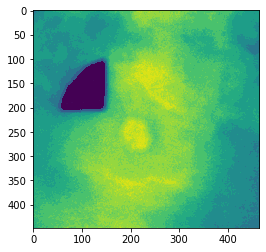

In [198]:
import cv2 
  
# path 
files_dict, files_list = frames_matrix_from_images_folder('/mnt/data/interim/_melanoma_20200728/checkyourskin/A63/2019-03-25_11-39-21')
src = files_list[0]
# Using cv2.rotate() method 
# Using cv2.ROTATE_180 rotate by  
# 180 degrees clockwise 
image = cv2.rotate(src, cv2.ROTATE_180) 
  
imshow(image) 

In [200]:
image.shape

(448, 466)

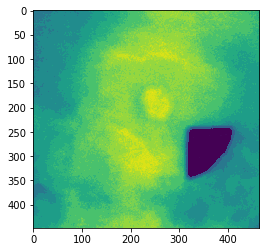

In [199]:
imshow(src)

In [201]:
src.shape

(448, 466)